# **Project Name**    - Netflix Movies And TV Shows Clustering



##### **Project Type**    - Unsupervised
##### **Contribution**    - Individual
##### **Team Member 1 -** - Siddesh Sakhalkar


# **Project Summary -**

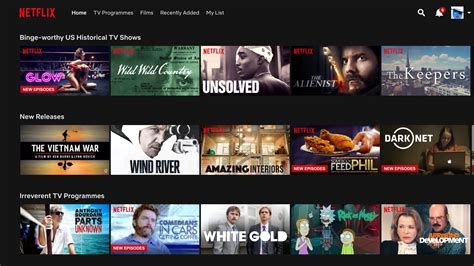

Netflix utilizes a sophisticated methodology called "Netflix Movies and TV Shows Clustering" to categorize its extensive collection of content, employing advanced data analysis and machine learning techniques. By systematically examining a range of attributes associated with each title, such as genre, cast, plot, and other pertinent characteristics, Netflix identifies significant patterns and resemblances. This enables the platform to offer users personalized viewing suggestions that align with their historical choices and preferences, enhancing user involvement and contentment, and consequently boosting viewer retention and corporate profitability.

The process of Netflix Movies and TV Shows Clustering hinges on a data-centric strategy that involves the compilation and examination of diverse data markers, encompassing elements such as genre, cast, director, and plot, among others. Netflix then leverages unsupervised machine learning algorithms, including renowned clustering methodologies like k-means, hierarchical clustering, and principal component analysis (PCA), to discern connections and similarities among different titles.

These algorithms play a pivotal role in segmenting the content into discrete clusters, each representing a distinctive genre or category. This dynamic clustering approach aims to optimize the user experience by delivering custom-tailored content recommendations that dovetail seamlessly with an individual's historical viewing habits and preferences. The strategic organization of the content library into coherent clusters enhances the likelihood of retaining user engagement, fostering a more profound connection with the platform.

Beyond its direct impact on user gratification, clustering confers upon Netflix the ability to make informed, data-driven determinations regarding content creation and licensing. A comprehensive understanding of the fundamental trends and patterns in user conduct empowers Netflix to make discerning choices concerning the selection, production, or acquisition of titles. Such insights ultimately contribute to heightening customer allegiance and augmenting overall corporate revenue.

# **GitHub Link -**

https://github.com/siddeshsakhalkar2002/Netflix-Movies-And-TV-Shows-Clustering

# **Problem Statement**


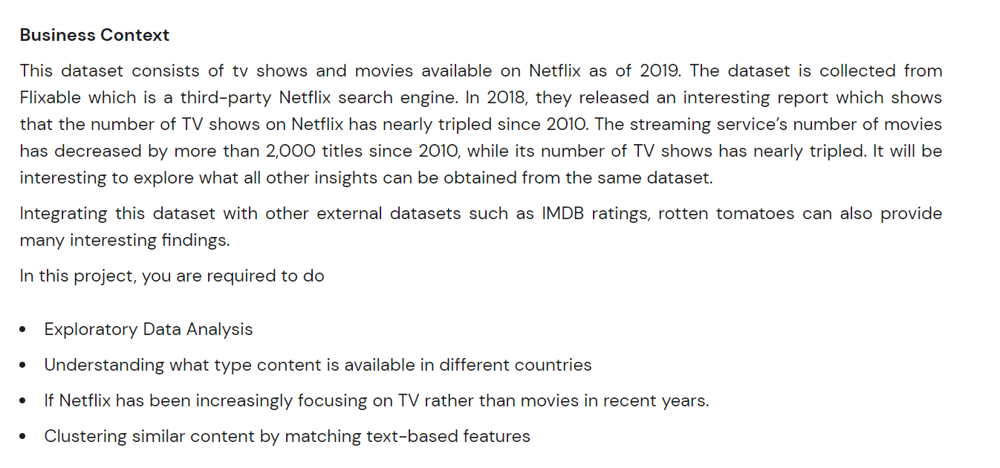

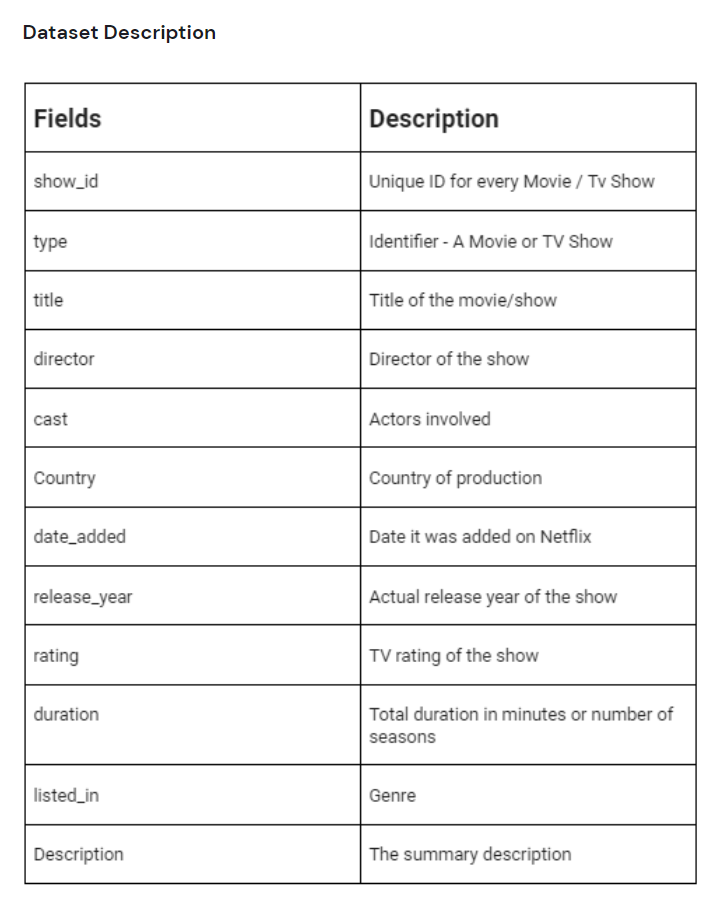

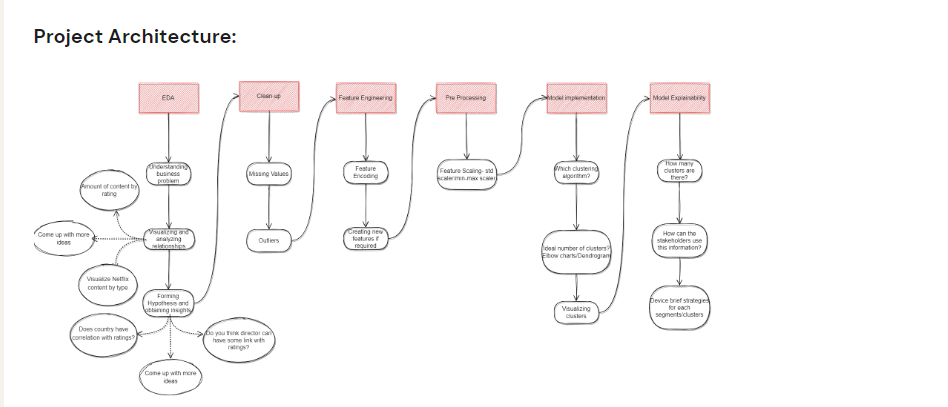

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [ ]:
# Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import matplotlib.cm as cm
from wordcloud import WordCloud, STOPWORDS
%matplotlib inline


#for nlp
from sklearn import preprocessing
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split, KFold
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer

from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples
import scipy.cluster.hierarchy as sch


import warnings
warnings.filterwarnings('ignore')

### Dataset Loading

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Load Dataset
data = pd.read_csv('/content/drive/MyDrive/projects/unsupervised/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv')

### Dataset First View

In [ ]:
# Dataset First Look
data.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
data.shape

(7787, 12)

### Dataset Information

In [ ]:
# Dataset Info
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count
data.duplicated().sum()

0

#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
data.isnull().sum()

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64

<BarContainer object of 12 artists>

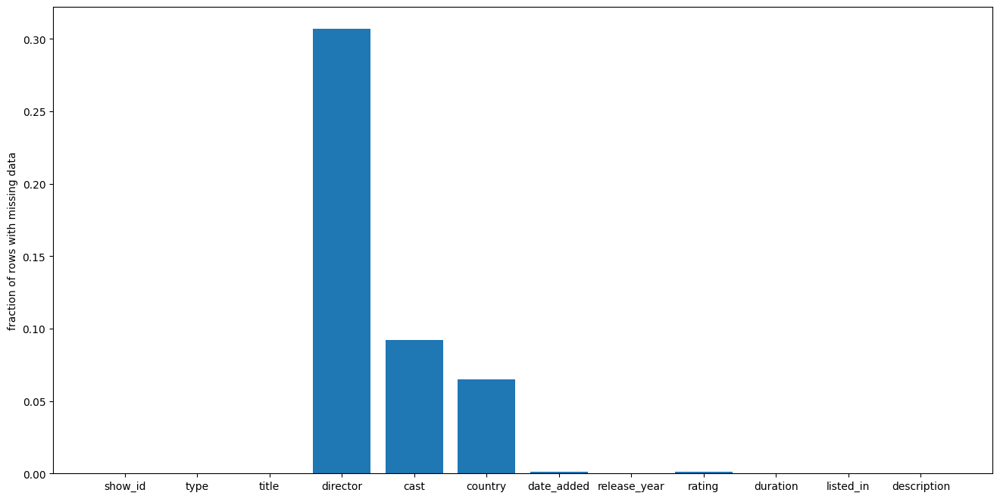

In [ ]:
# Visualizing the missing values
null_counts = data.isnull().sum()/len(data)
plt.figure(figsize=(16,8))
plt.xticks(np.arange(len(null_counts)),null_counts.index,rotation='horizontal')
plt.ylabel('fraction of rows with missing data')
plt.bar(np.arange(len(null_counts)),null_counts)

<Axes: >

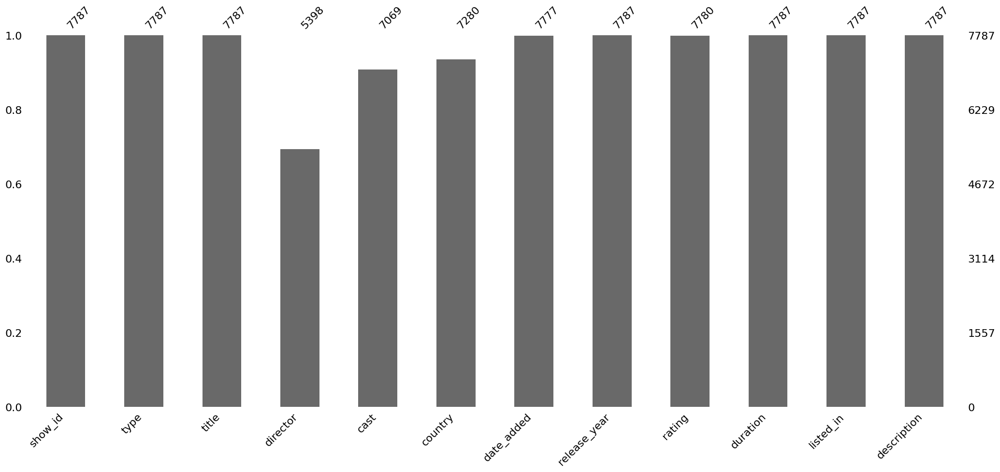

In [ ]:
import missingno as msno
msno.bar(data)

### What did you know about your dataset?

As we can check most of the columns are not having any missing of null value except
- Director (2389)
- Cast (718)
- Country (507)
- Date_added (10)
- Rating (7)

## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns
data.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [ ]:
# Dataset Describe
data.describe(include = 'all')

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
count,7787,7787,7787,5398,7069,7280,7777,7787.000000,7780,7787,7787,7787
unique,7787,2,7787,4049,6831,681,1565,NaN,14,216,492,7769
top,s1,Movie,3%,"Raúl Campos, Jan Suter",David Attenborough,United States,"January 1, 2020",NaN,TV-MA,1 Season,Documentaries,Multiple women report their husbands as missin...
freq,1,5377,1,18,18,2555,118,NaN,2863,1608,334,3
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.932580,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.757395,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1925.000000,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.000000,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017.000000,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018.000000,NaN,NaN,NaN,NaN


### Variables Description

Only one column Release_Date is numerical type, rest all are strings. So, Describe is not very useful in this case.

### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.
data.show_id.value_counts()

s1       1
s5172    1
s5200    1
s5199    1
s5198    1
        ..
s2592    1
s2591    1
s2590    1
s2589    1
s7787    1
Name: show_id, Length: 7787, dtype: int64

This shows that every row has a unique Id without any repeatation

In [ ]:
data.type.value_counts()

Movie      5377
TV Show    2410
Name: type, dtype: int64

This shows that the data is divided into two types only. Movies and TV Shows

In [ ]:
data.title.value_counts()

3%                                          1
Results                                     1
Rich in Love                                1
Ricardo Quevedo: Los amargados somos más    1
Ricardo Quevedo: Hay gente así              1
                                           ..
Hamza's Suitcase                            1
Hamid                                       1
Hamburger Hill                              1
Hamara Dil Aapke Paas Hai                   1
ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS     1
Name: title, Length: 7787, dtype: int64

In [ ]:
data.director.value_counts()

Raúl Campos, Jan Suter    18
Marcus Raboy              16
Jay Karas                 14
Cathy Garcia-Molina       13
Youssef Chahine           12
                          ..
Vibhu Virender Puri        1
Lucien Jean-Baptiste       1
Jason Krawczyk             1
Quinn Lasher               1
Sam Dunn                   1
Name: director, Length: 4049, dtype: int64

In [ ]:
data['cast'][2]

'Tedd Chan, Stella Chung, Henley Hii, Lawrence Koh, Tommy Kuan, Josh Lai, Mark Lee, Susan Leong, Benjamin Lim'

In [ ]:
data['cast'][10]

"Thomas Jane, Molly Parker, Dylan Schmid, Kaitlyn Bernard, Bob Frazer, Brian d'Arcy James, Neal McDonough"

We can check that though cast is a list but it is given as string which we need to change

In [ ]:
data.country.value_counts()

United States                                                   2555
India                                                            923
United Kingdom                                                   397
Japan                                                            226
South Korea                                                      183
                                                                ... 
Russia, United States, China                                       1
Italy, Switzerland, France, Germany                                1
United States, United Kingdom, Canada                              1
United States, United Kingdom, Japan                               1
Sweden, Czech Republic, United Kingdom, Denmark, Netherlands       1
Name: country, Length: 681, dtype: int64

We can see that most of the movies or shows are from United States, followed by India, United Kingdom, Japan and South Korea.

In [ ]:
data.release_year.value_counts()

2018    1121
2017    1012
2019     996
2016     882
2020     868
        ... 
1925       1
1964       1
1966       1
1947       1
1959       1
Name: release_year, Length: 73, dtype: int64

1.   We can see that most of the movies are release in the recent years, showning that recently Netflix is gaining more popularity, Though it was launched in 1997.
    
2.  The platform is also focusing on uploaded the newly launched moveies and shows



In [ ]:
data.date_added.value_counts()

January 1, 2020      118
November 1, 2019      94
December 31, 2019     76
March 1, 2018         76
October 1, 2018       72
                    ... 
October 12, 2014       1
March 22, 2020         1
March 31, 2013         1
December 12, 2019      1
January 11, 2020       1
Name: date_added, Length: 1565, dtype: int64

We can see that the platform is increasing the addition of contents year by year

In [ ]:
data.rating.value_counts()

TV-MA       2863
TV-14       1931
TV-PG        806
R            665
PG-13        386
TV-Y         280
TV-Y7        271
PG           247
TV-G         194
NR            84
G             39
TV-Y7-FV       6
UR             5
NC-17          3
Name: rating, dtype: int64

In [ ]:
data.duration.value_counts()

1 Season     1608
2 Seasons     382
3 Seasons     184
90 min        136
93 min        131
             ... 
182 min         1
224 min         1
233 min         1
196 min         1
191 min         1
Name: duration, Length: 216, dtype: int64

In [ ]:
data.listed_in.value_counts()

Documentaries                                                                      334
Stand-Up Comedy                                                                    321
Dramas, International Movies                                                       320
Comedies, Dramas, International Movies                                             243
Dramas, Independent Movies, International Movies                                   215
                                                                                  ... 
Crime TV Shows, Romantic TV Shows, Spanish-Language TV Shows                         1
Crime TV Shows, International TV Shows, Reality TV                                   1
International Movies, Romantic Movies, Sci-Fi & Fantasy                              1
Stand-Up Comedy & Talk Shows, TV Mysteries, TV Sci-Fi & Fantasy                      1
International TV Shows, Spanish-Language TV Shows, Stand-Up Comedy & Talk Shows      1
Name: listed_in, Length: 492, dtype: int64

In [ ]:
data.description[0]

'In a future where the elite inhabit an island paradise far from the crowded slums, you get one chance to join the 3% saved from squalor.'

## 3. ***Data Wrangling***

### Data Wrangling Code

In [ ]:
# Write your code to make your dataset analysis ready.

In [ ]:
# converting the cast column into a list
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
data.isnull().sum()

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64

In [ ]:
#fillna() is a function in Pandas, a Python library for data analysis, that we used to replace missing (NaN) values in our DataFrame with a specified value.
data['cast'].fillna('No cast',inplace=True)
data['country'].fillna(data['country'].mode()[0],inplace=True)
data['director'].fillna('', inplace=True)

In [ ]:
#'date_added' and 'rating' contains an lower and not much important portion of the data so we will drop them from our analysis.
data.dropna(subset=['date_added','rating'],inplace=True)

In [ ]:
data.isnull().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
dtype: int64

### What all manipulations have you done and insights you found?

Answer Here.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

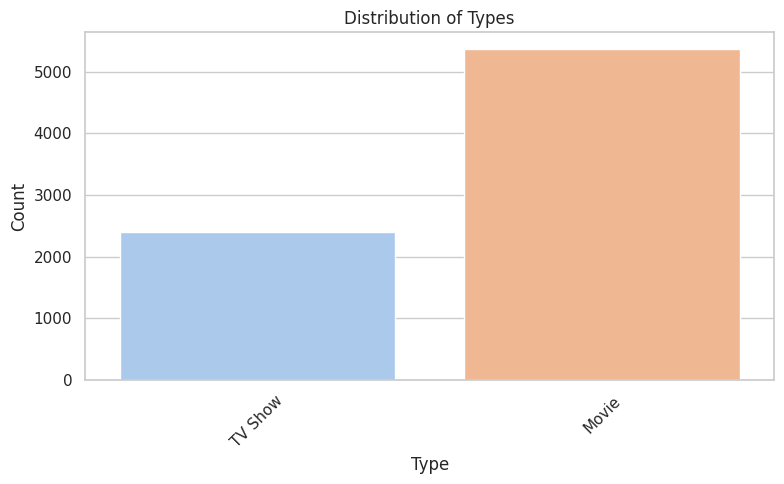

In [ ]:
# Chart - 1 visualization code
sns.set(style="whitegrid", palette="pastel")
plt.figure(figsize=(8, 5))

sns.countplot(data=data, x='type')

plt.title("Distribution of Types")
plt.xlabel("Type")
plt.ylabel("Count")

plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

There are only two types namely TV shows and Movies, so we want to check which are greater in number.

##### 2. What is/are the insight(s) found from the chart?

There are more obervations of Movies than TV shows in our dataset.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Based on this insight, Netflix could potentially make informed decisions about the types of content to prioritize in its programming and marketing efforts. For example, if the data suggests that subscribers are more interested in movies than TV shows, Netflix could allocate more resources towards acquiring or producing movie content, or promoting existing movie content to increase engagement and retention.

#### Chart - 2

In [ ]:
# Chart - 2 visualization code
df_pie = data.groupby(['rating'])['show_id'].count().reset_index()

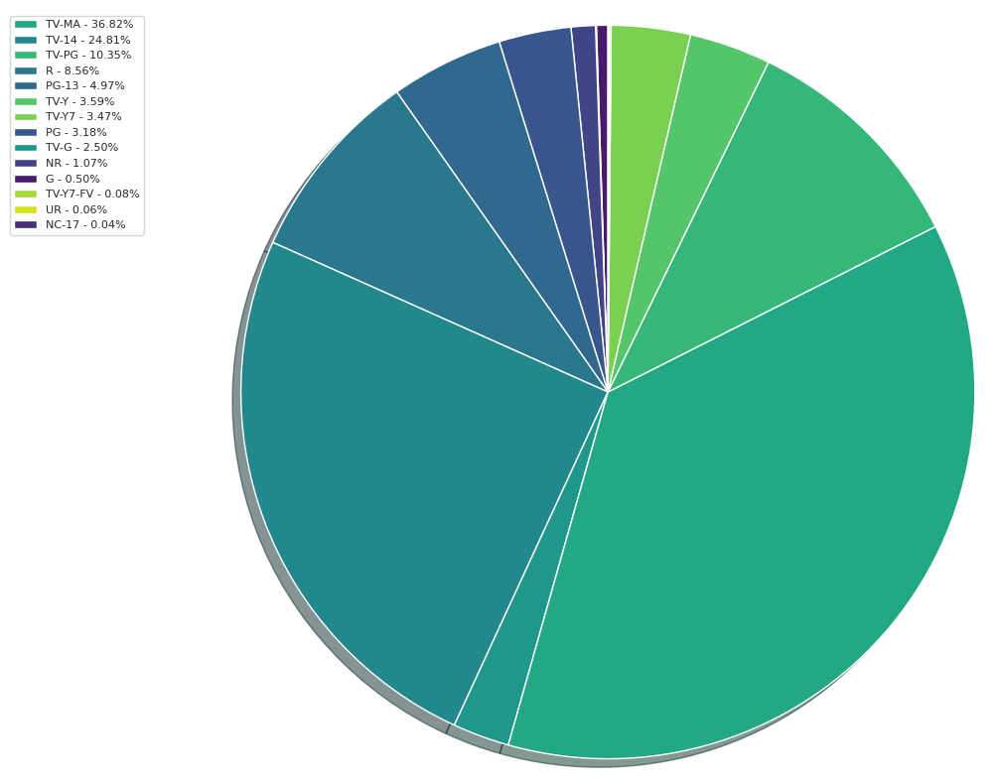

In [ ]:
x = np.char.array(list(df_pie['rating'].values))
y = np.array(df_pie['show_id'].values)

colors = sns.color_palette('viridis', n_colors=len(y))

porcent = 100. * y / y.sum()
plt.figure(figsize=(10, 10))

sns.set(style="whitegrid")  # Applying the thirtyfive style

patches, texts = plt.pie(y, colors=colors, startangle=90, radius=1.2, shadow=True)
labels = ['{0} - {1:1.2f}%'.format(i, j) for i, j in zip(x, porcent)]

sort_legend = True
if sort_legend:
    patches, labels, dummy = zip(*sorted(zip(patches, labels, y),
                                          key=lambda x: x[2],
                                          reverse=True))

plt.legend(patches, labels, loc='best', bbox_to_anchor=(-0.1, 1.),
           fontsize=8)


##### 1. Why did you pick the specific chart?

Rating is an important aspect for any content based platform and we want to analyse the different types of rating and the extent of content it has.

##### 2. What is/are the insight(s) found from the chart?



  The majority of the rated content on Netflix falls into the TV-MA and TV-14 categories.
  
  The high share of TV-MA and TV-14 rated content suggests that there is a significant audience for mature and teen-oriented content.



##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

This data can be used by advertisers to target their ads more effectively to the desired audience. Since different ratings may have different demographics, advertisers can use this data to plan and target their campaigns more accurately.

#### Chart - 3

In [ ]:
# Chart - 3 visualization code
df_release_year = data.groupby(['release_year','type'])['show_id'].count().reset_index()
df_release_year

,release_year,type,show_id
0,1925,TV Show,1
1,1942,Movie,2
2,1943,Movie,3
3,1944,Movie,3
4,1945,Movie,3
...,...,...,...
113,2019,TV Show,414
114,2020,Movie,411
115,2020,TV Show,457
116,2021,Movie,12


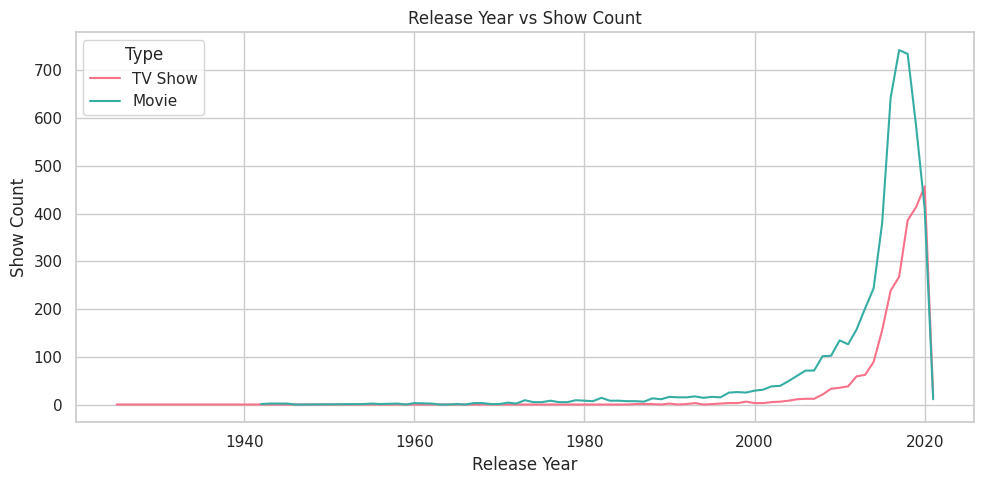

In [ ]:
sns.set(style="whitegrid")
plt.figure(figsize=(10, 5))
colors = sns.color_palette('husl', n_colors=len(df_release_year['type'].unique()))

sns.lineplot(data=df_release_year, x='release_year', y='show_id', hue='type', palette=colors)

plt.title("Release Year vs Show Count")
plt.xlabel("Release Year")
plt.ylabel("Show Count")
plt.legend(title='Type')
plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

We used this plot to check the distribution of TV shows and movies across years. Line plots are a useful tool for analyzing trends and patterns over time, especially when dealing with data across different years.

##### 2. What is/are the insight(s) found from the chart?

*  The insight that can be drawn is that the number of TV shows and movies on Netflix has increased significantly since 2010.
* The significant increase in the number of TV shows and movies on Netflix since 2010 could reflect the evolution of the streaming industry. As more consumers have shifted away from traditional cable and satellite TV, the demand for on-demand streaming services has increased. Netflix has responded to this trend by investing in its content library and expanding its offerings to attract more subscribers.
* Netflix is known for its data-driven decision-making approach, and the increase in the number of TV shows and movies on its platform could reflect the company's use of data to identify consumer preferences and trends.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.


By understanding audience preferences and trends, Netflix can continue to build a content library that meets the needs and preferences of its subscribers. This could help improve the overall customer experience and increase customer satisfaction, which could in turn lead to higher retention rates and increased revenue.

By building a robust and diverse content library, Netflix can establish a competitive advantage over its rivals in the streaming industry. This can help attract more subscribers and increase market share, which could contribute to the overall success of the business.



#### Chart - 4

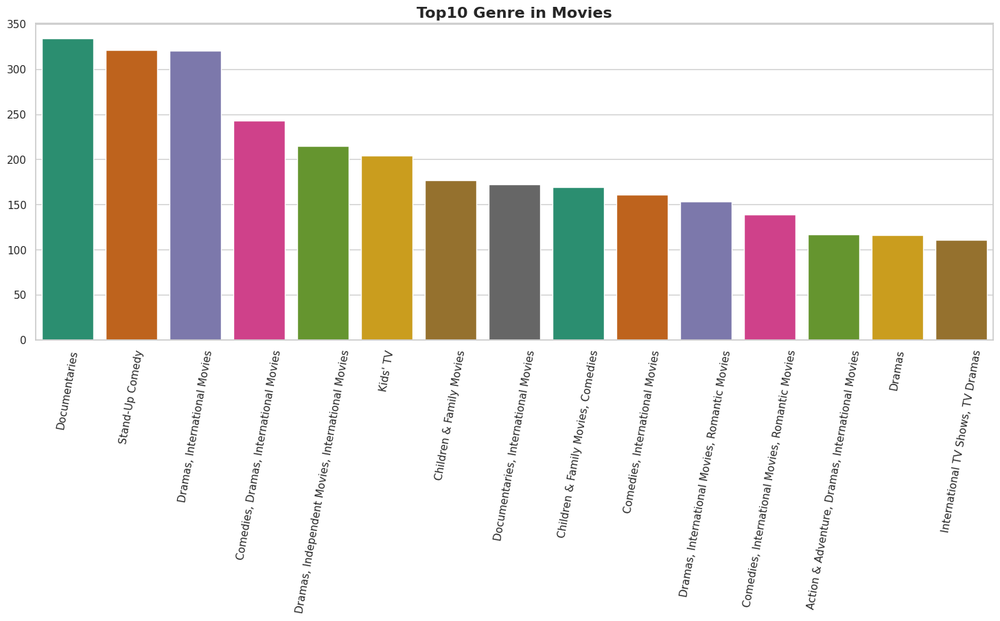

In [ ]:
# Chart - 4 visualization code
plt.figure(figsize=(18,6))
sns.barplot(x = data["listed_in"].value_counts().head(15).index,
            y = data["listed_in"].value_counts().head(15).values,palette="Dark2")
plt.xticks(rotation=80)
plt.title("Top10 Genre in Movies",size='16',fontweight="bold")
plt.show()

##### 1. Why did you pick the specific chart?

Bar plots are used to visualize and compare categorical data. We used bar plot to plot the average count of all the genres in our dataset.

##### 2. What is/are the insight(s) found from the chart?

Documentaries, Stand-up Comedy, Drama, International movies and comedies are some of the highly popular content on the platform. the reason being people use ott platforms as the source of entertainment and they often love the content that is more relatable to their life and feel real.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

These insights could help Netflix make informed decisions about its content acquisition and production strategies. By understanding the popularity of different genres among its subscribers, Netflix can build a more diverse and appealing content library that meets the needs and preferences of its audience. This could help drive subscriber growth, increase engagement, and establish a competitive advantage in the streaming industry.

#### Chart - 5

In [ ]:
# Chart - 5 visualization code
df_duration = data.groupby(['duration'])['show_id'].count().sort_values(ascending= False).reset_index()
df_duration

,duration,show_id
0,1 Season,1606
1,2 Seasons,378
2,3 Seasons,183
3,90 min,136
4,93 min,131
...,...,...
211,196 min,1
212,194 min,1
213,193 min,1
214,43 min,1


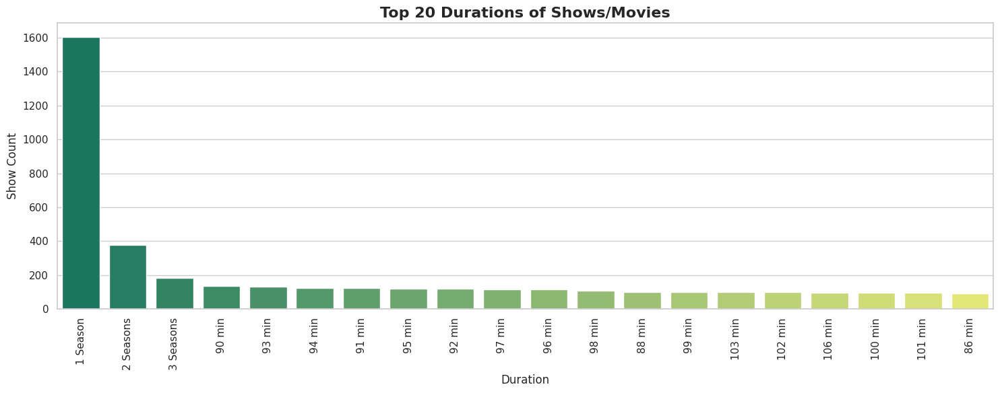

In [ ]:
plt.figure(figsize=(15, 6))

colors = sns.color_palette('summer', n_colors=20)

sns.barplot(data=df_duration, x=df_duration['duration'][:20], y=df_duration['show_id'], palette=colors)

plt.xticks(rotation=90)
plt.title("Top 20 Durations of Shows/Movies", size='16', fontweight="bold")
plt.xlabel("Duration")
plt.ylabel("Show Count")

plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

Bar plot here is used to plot the duration vs show-id count

##### 2. What is/are the insight(s) found from the chart?

* We can see that the maximum number of content in our data is related to Season 1, where the TV shows, movies or webseries made on the platform have atleast 1 season length.
* The fact that "Season 1" is the most frequent duration for TV shows on Netflix suggests that the streaming service typically organizes its original programming into seasons, rather than releasing episodes one-by-one or in smaller batches.
* The fact that "Season 1" is the most frequent duration for TV shows on Netflix could suggest that viewers are most likely to watch new shows when they are first released, rather than waiting for subsequent seasons to be released. This could be due to the marketing and promotion efforts that Netflix puts into new shows, or to the fact that viewers are more likely to be interested in a show when it is first released.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

These insights could be helpful in guiding Netflix's content acquisition and production strategies. By understanding the duration preferences of viewers, Netflix can make informed decisions about how to structure and release its original content, and how to allocate resources to produce content that resonates with its audience.


#### Chart - 6

In [ ]:
# Chart - 6 visualization code
df_country = data.groupby(['country', 'type'])['show_id'].count().sort_values(ascending = False).reset_index()
df_country

,country,type,show_id
0,United States,Movie,2076
1,United States,TV Show,975
2,India,Movie,852
3,United Kingdom,TV Show,203
4,United Kingdom,Movie,193
...,...,...,...
768,"Indonesia, United States",Movie,1
769,"Iran, France",Movie,1
770,"Ireland, Canada",Movie,1
771,"Ireland, Canada, Luxembourg, United States, Un...",Movie,1


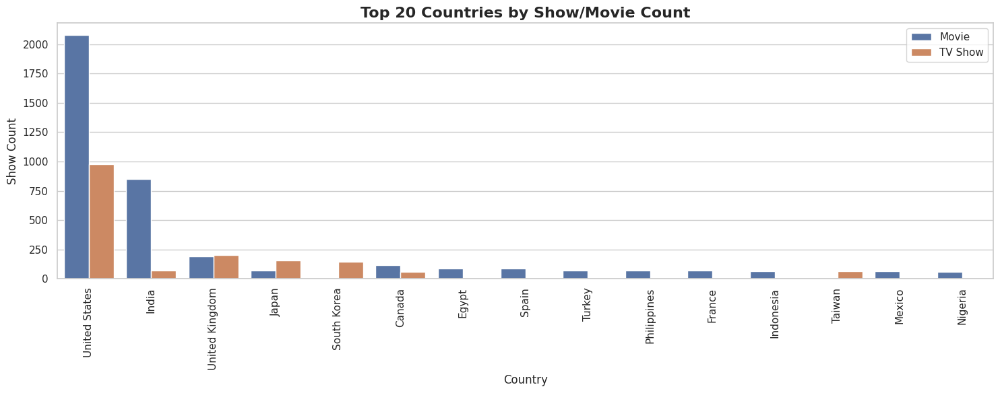

In [ ]:
plt.figure(figsize=(15, 6))

sns.set(style="whitegrid")  # Applying the thirtyfive style

sns.barplot(data=df_country, x=df_country['country'][:20], y=df_country['show_id'], hue='type')

plt.xticks(rotation=90)
plt.title("Top 20 Countries by Show/Movie Count", size='16', fontweight="bold")
plt.xlabel("Country")
plt.ylabel("Show Count")

plt.legend(loc='upper right')

plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

Here we are doing Bivariate analysis using bar plot to compare the number of movies and TV shows produced by different countries. Bivariate analysis bar plots are used to compare the relationship between two categorical variables

##### 2. What is/are the insight(s) found from the chart?

USA and India are topmost countries in producing content over the platform.

* As both the USA and India have very distinct cultural identities, the high production volume of movies and TV shows from these countries could indicate that their culture and values are widely consumed and popular among audiences worldwide.
* The fact that USA and India are the top producers of movies and TV shows could indicate that these markets are more attractive for investment in the industry.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The dominance of the USA and India in the movie and TV show production industry is an important insight for the industry as it can help inform business decisions related to production, distribution, and marketing.

#### Chart - 7

<Figure size 1400x800 with 0 Axes>

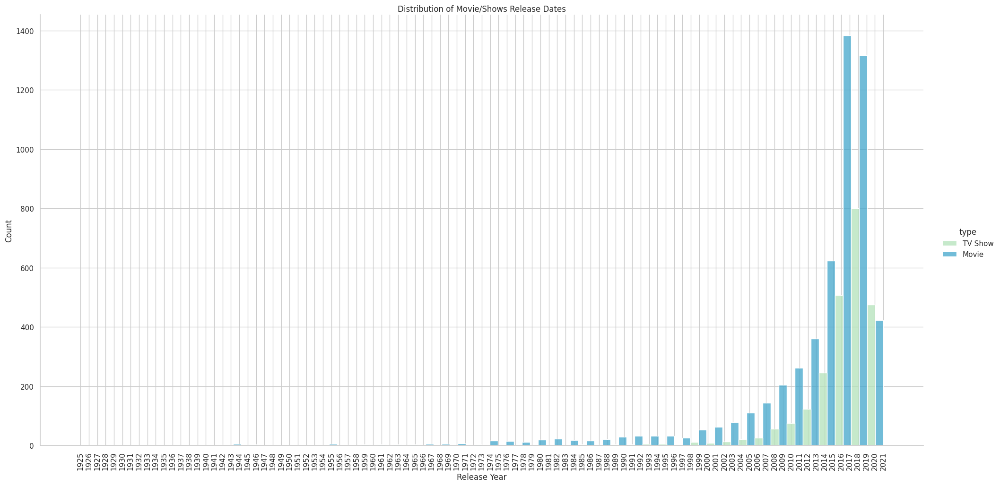

In [ ]:
# Chart - 7 visualization code
a = plt.figure(figsize=(14,8))
a = sns.displot(x='release_year', hue = 'type', data = data, kind = 'hist', height=10, aspect=2, bins = 50, multiple='dodge', palette='GnBu')
a = plt.xticks(ticks= np.arange(data.release_year.min(),data.release_year.max()+1,1), rotation = 90)
a = plt.title('Distribution of Movie/Shows Release Dates')
a = plt.xlabel('Release Year')

##### 1. Why did you pick the specific chart?

We picked histogram to visualize the concentration of movie and TV show releases over time, showing when the number of releases began to increase and decrease.

##### 2. What is/are the insight(s) found from the chart?

* There is rapid increase in content over the platform after 2010.
* In 2017, the maximum number of movies were released while in 2018 the maximum number of TV shows were released.
* Between 2017-2019, the maximum content is released or added to the platform.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

These insights could be useful for understanding the growth trajectory of Netflix and for making informed decisions related to content strategy and marketing efforts.

#### Chart - 8

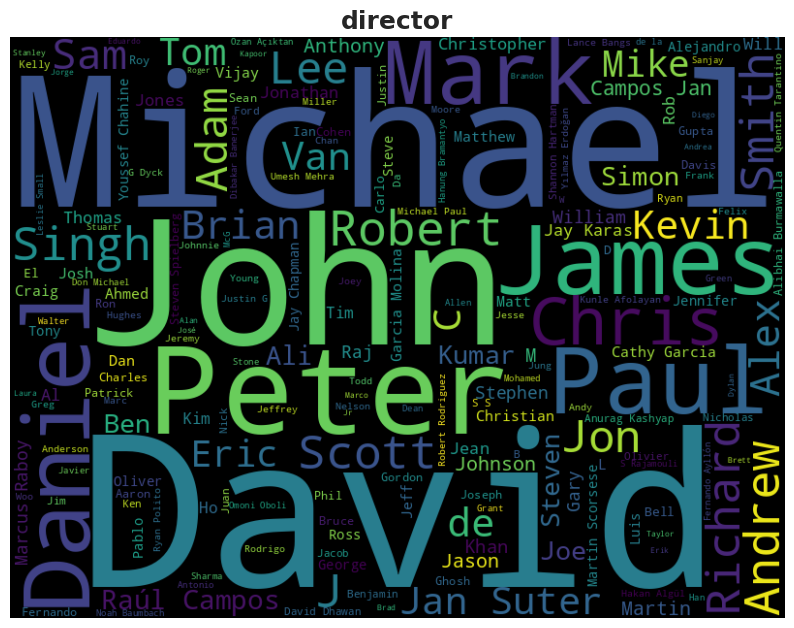

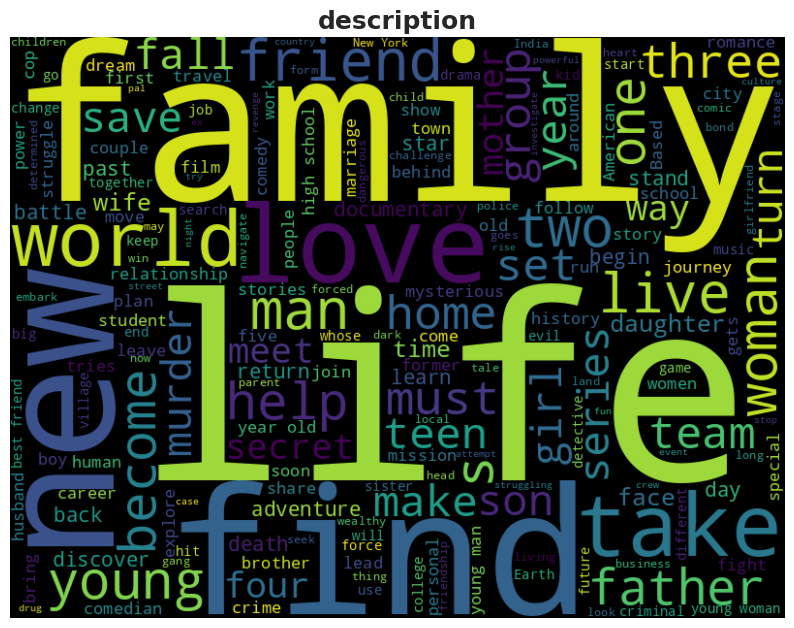

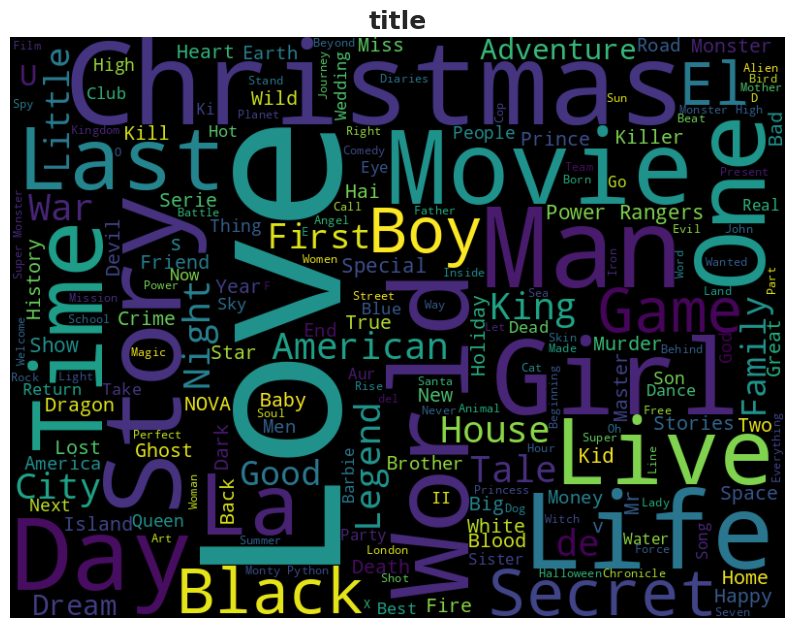

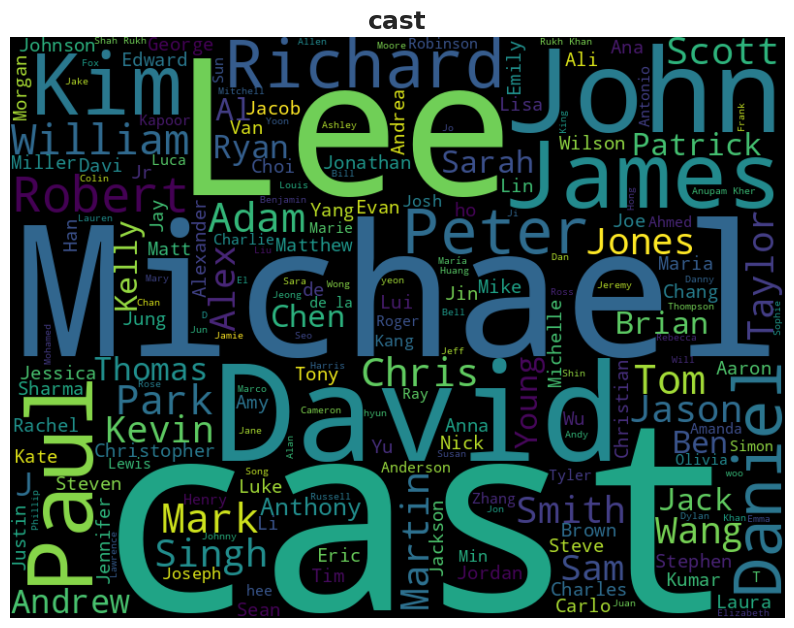

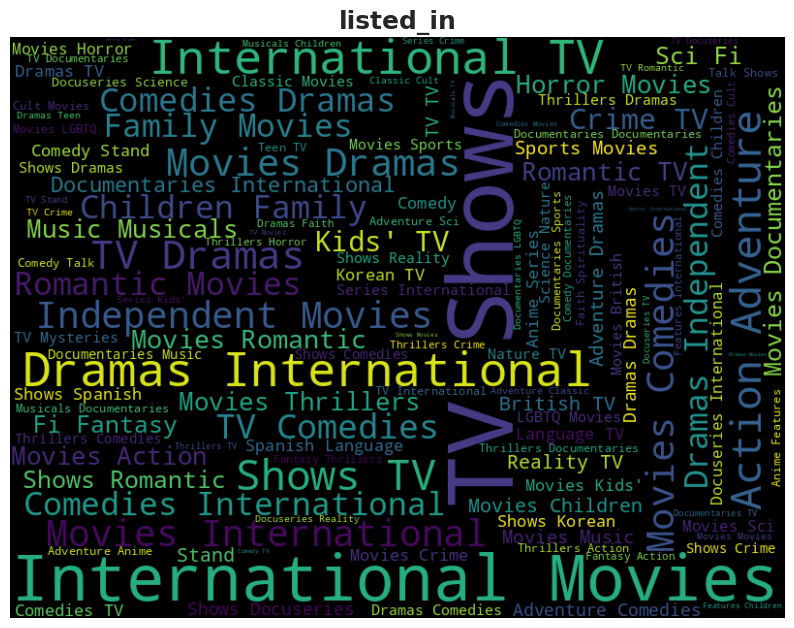

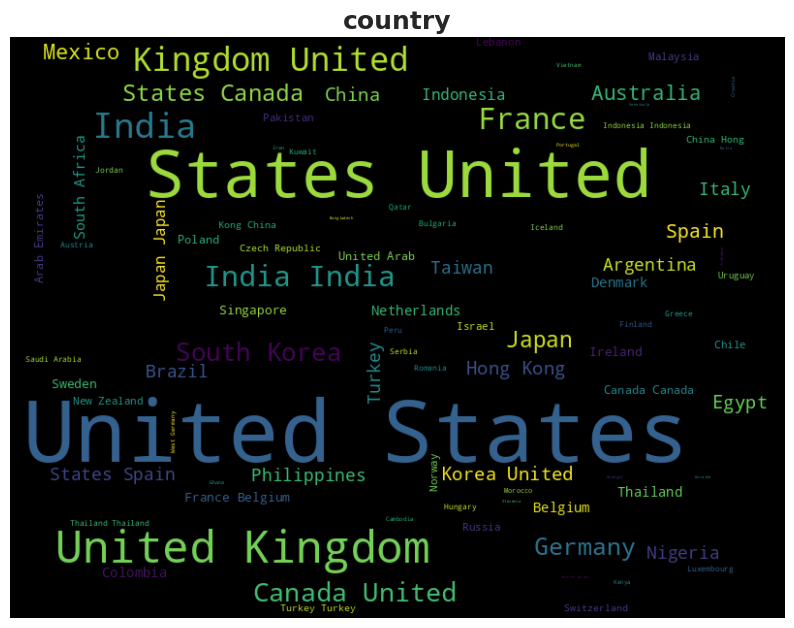

In [ ]:
# Chart - 8 visualization code
#from wordcloud import WordCloud, STOPWORDS
features_for_wordplot = ['director', 'description', 'title', 'cast', 'listed_in', 'country']

for i in features_for_wordplot:
    df_word_cloud = data[i]
    text = " ".join(str(word) for word in df_word_cloud)  # Convert to string to handle non-string data
    # Create stopword list:
    stopwords = set(STOPWORDS)
    # Generate a word cloud image
    wordcloud = WordCloud(stopwords=stopwords, background_color="black", width=800, height=600).generate(text)
    # Display the generated image
    plt.figure(figsize=(10, 8))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(i, fontsize=18, fontweight='bold')
    plt.show()

##### 1. Why did you pick the specific chart?

We used a word cloud plot to visualize the most frequently occurring words or terms in a given text or dataset. Word clouds are often used to provide a quick and intuitive visualization of the most important or relevant words, which can help identify key themes, topics, or patterns in the data.

##### 2. What is/are the insight(s) found from the chart?

* In director, the most frequent director names are -: David, Michael, Johns, Daniel, Paul
* In description, the most frequently used words are-: find, love, life, live, man, woman, battle, help, friend etc. which suggests that movies often center around themes of relationships, personal growth, and overcoming obstacles.
* In cast, the most frequent actor names are-: Michael, James, David, John, Paul etc.
* In listed_in, the most frequent genres are-: international movies, dramas, action, adventure, international movies etc.
* In country, most frequent names are-: US, India, UK, Japan, Germany, Cannada etc.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

*  Netflix could use this information to tailor its content recommendations to users based on their location, genre preferences, and popular actors/directors. By understanding what types of movies are most popular in which countries, Netflix could produce more localized content and expand its subscriber base.

* Additionally, by identifying the most frequent keywords used in movie descriptions, Netflix could optimize its search algorithm to return more accurate results, and also use this information to craft more compelling movie synopses to entice users to watch.

* Overall, the insights gained from analyzing the Netflix dataset by the above word plot could be leveraged by Netflix to make better business decisions and provide a more personalized experience for its users, which could lead to increased subscriber satisfaction and revenue.

#### Chart - 9

In [ ]:
tv_shows=data[data['type']=='TV Show']
movies=data[data['type']=='Movie']

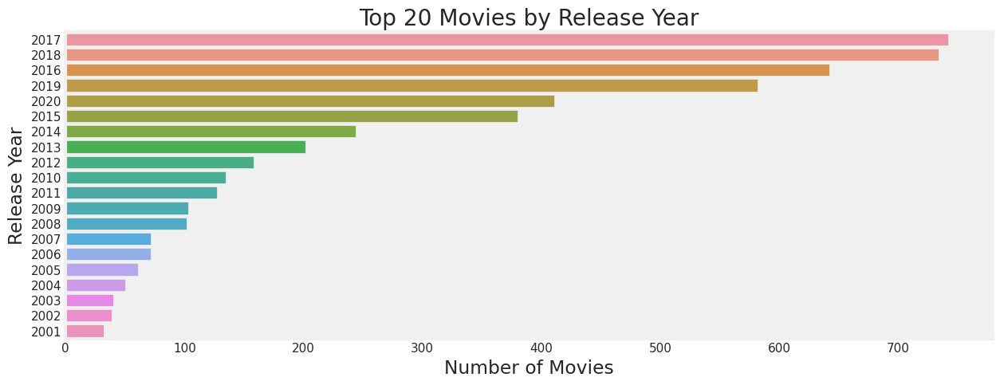

In [ ]:
# Chart - 9 visualization code
plt.figure(figsize=(15, 5))
plt.style.use("fivethirtyeight")
sns.set_palette(['#17C37B', '#F92969', '#FACA0C'])
sns.countplot(y=movies['release_year'], data=data, order=movies['release_year'].value_counts().index[0:20])
plt.title('Top 20 Movies by Release Year')
plt.xlabel('Number of Movies')
plt.ylabel('Release Year')
plt.grid(axis='x')
plt.show()

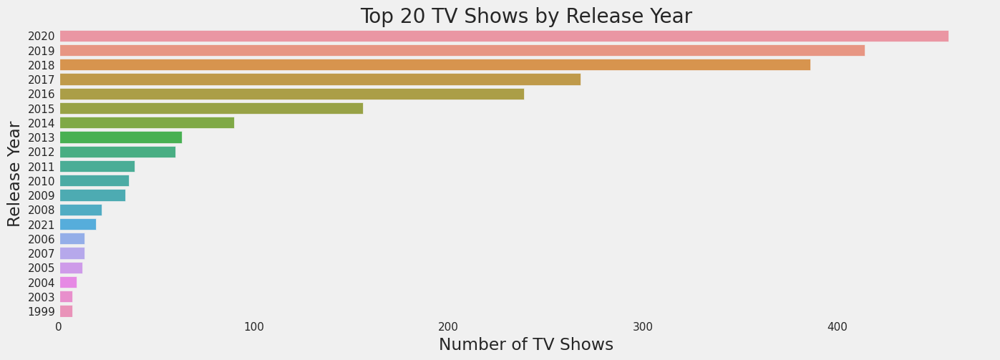

In [ ]:
plt.figure(figsize=(15, 5))
plt.style.use("fivethirtyeight")
sns.set_palette("husl")
sns.countplot(y=tv_shows['release_year'], data=data, order=tv_shows['release_year'].value_counts().index[0:20])
plt.title('Top 20 TV Shows by Release Year')
plt.xlabel('Number of TV Shows')
plt.ylabel('Release Year')
plt.grid(axis='x')
plt.show()

##### 1. Why did you pick the specific chart?

We used this chart to plot the count of TV shows and movies differently.

##### 2. What is/are the insight(s) found from the chart?

* Maximum number of movies released or added is in the year 2018.
* Maximum number of TV shows released is in the year 2020, as it was covid time period and everyone is at their home, so netflix use this opportunity to give offers and quality content to the audiences that led to more release in movies and TV shows.
* We saw a huge increase in the number of movies and television episodes after 2014.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the gained insights can potentially help create a positive business impact. Understanding peak release years for movies and TV shows allows Netflix to strategically plan its content acquisition and production efforts. Capitalizing on trends like the surge in TV show releases during the COVID-19 pandemic demonstrates adaptability to user preferences, potentially leading to increased user engagement, subscriptions, and revenue.

#### Chart - 10

In [ ]:
# Chart - 10 visualization code
data['month'] = pd.DatetimeIndex(data['date_added']).month
data.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,month
0,s1,TV Show,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,8
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,12
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",12
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",11
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,1


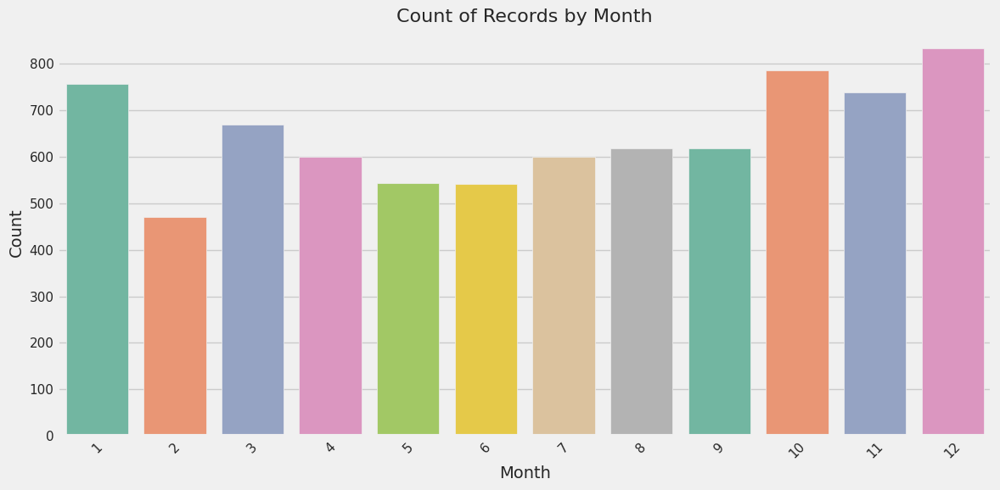

In [ ]:
plt.figure(figsize=(12, 6))
plt.style.use("fivethirtyeight")

ax = sns.countplot(x='month', data=data, palette='Set2')

plt.xlabel('Month', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Count of Records by Month', fontsize=16)

plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

<Figure size 1500x600 with 0 Axes>

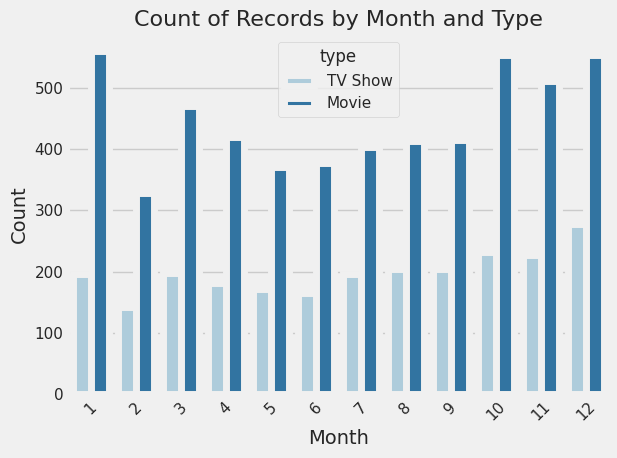

In [ ]:
plt.style.use("fivethirtyeight")
plt.figure(figsize=(15, 6))

fig, ax = plt.subplots()
sns.countplot(x='month', hue='type', data=data, ax=ax, palette='Paired', linewidth=5)

plt.xlabel('Month', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Count of Records by Month and Type', fontsize=16)

plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

Countplot is used to Show the counts of observations in each categorical bin using bars. We used this specific chart to check the count of TV shows and movies over month.

##### 2. What is/are the insight(s) found from the chart?

Maximum number of content is released in the month of December followed by january.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

These insights can be used to promote more targeted marketing strategies in specific months when the release is high. It can help drive more subsriptions to the platform and eventually more revenue.

#### Chart - 11

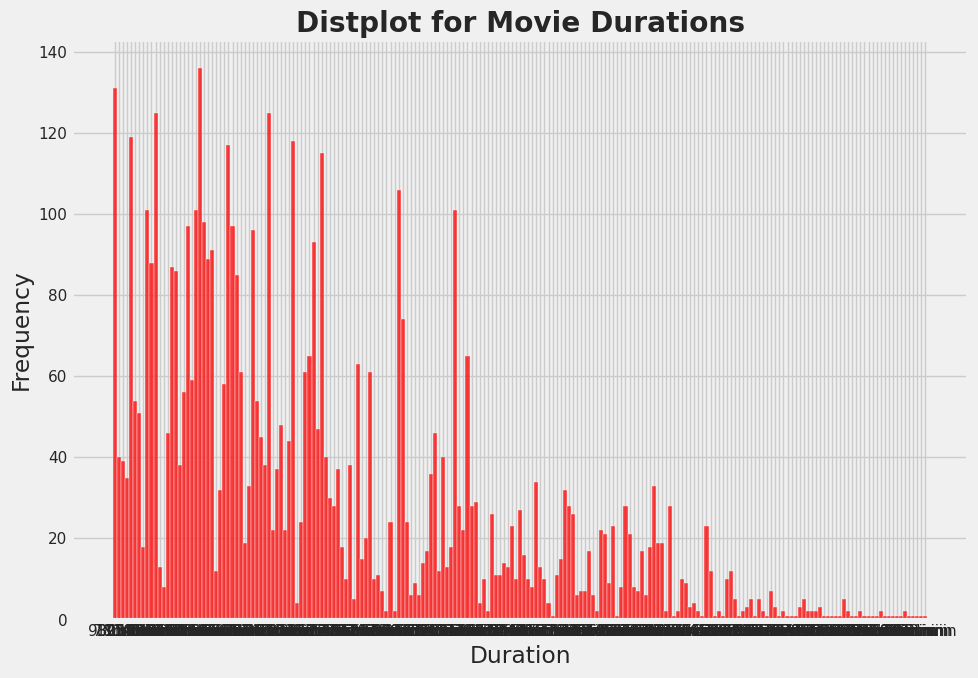

In [ ]:
# Chart - 11 visualization code
plt.figure(figsize=(10, 7))
sns.histplot(movies['duration'], kde=False, color='red')
plt.title('Distplot for Movie Durations', fontweight='bold')
plt.xlabel('Duration')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

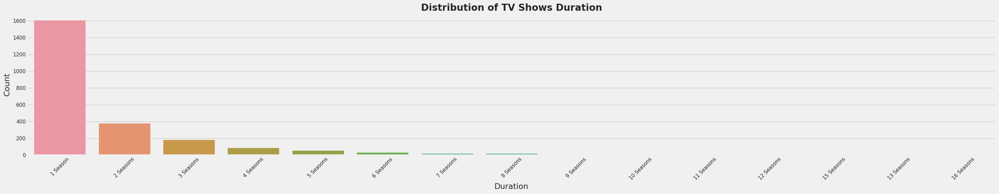

In [ ]:
plt.figure(figsize=(30, 6))
plt.title("Distribution of TV Shows Duration", fontweight='bold')
sns.set_palette('autumn')
sns.countplot(x=tv_shows['duration'], data=tv_shows, order=tv_shows['duration'].value_counts().index)
plt.xlabel('Duration')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

To check the distribution of duration feature for movies, and TV shows.

##### 2. What is/are the insight(s) found from the chart?

The variable named duration follow a distribution which is close to normal distribution, while there is highly skewed distribution for TV shows.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

most movies duration is in range of 90 to 120

#### Chart - 12

In [ ]:
# Chart - 12 visualization code
data['date_added'] = pd.to_datetime(data['date_added'])
data['year_added'] = data['date_added'].dt.year

In [ ]:
movies = data[data['type']=='Movie']
tv_shows= data[data['type']=='TV Show']

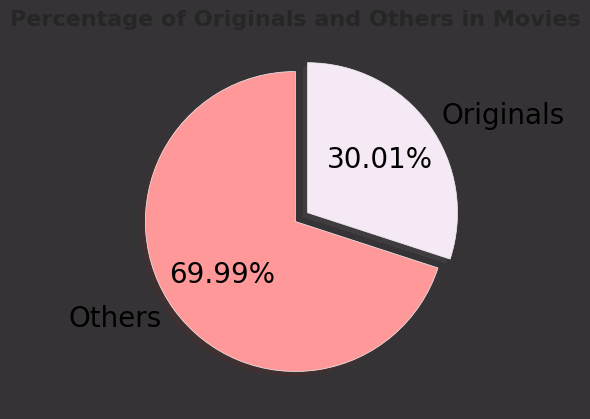

In [ ]:
movies['originals'] = np.where(movies['release_year'] == movies['year_added'], 'Yes', 'No')

# Creating the pie chart
fig, ax = plt.subplots(figsize=(5, 5), facecolor="#363336")
ax.patch.set_facecolor('#363336')
explode = (0, 0.1)
ax.pie(movies['originals'].value_counts(), explode=explode, autopct='%.2f%%', labels=['Others', 'Originals'],
       shadow=True, startangle=90, textprops={'color': "black", 'fontsize': 20},
       colors=['#FF9999', '#F5E9F5'])

plt.title("Percentage of Originals and Others in Movies", fontweight='bold', fontsize=16)


plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

We used pie chart, with specifying several parameters to plot the difference between Netflix's original content and other content on the platform.

##### 2. What is/are the insight(s) found from the chart?

Netflix has over 30% original content which shows that netflix invests heavily in creating and promoting their own original content. This can be seen as part of Netflix's strategy to differentiate themselves from other streaming platforms and to maintain a competitive advantage.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* By promoting their original content, Netflix can also build their brand recognition and reputation as a provider of high-quality and innovative content.

* By understanding the popularity of original content on the platform can help Netflix make more informed decisions about content acquisition and retention, marketing, and brand management, which can ultimately lead to a positive business impact for the company.

#### Chart - 14 - Correlation Heatmap

In [ ]:
# Correlation Heatmap visualization code

In [ ]:
ratings = {
    'TV-PG': 'Older Kids',
    'TV-MA': 'Adults',
    'TV-Y7-FV': 'Older Kids',
    'TV-Y7': 'Older Kids',
    'TV-14': 'Teens',
    'R': 'Adults',
    'TV-Y': 'Kids',
    'NR': 'Adults',
    'PG-13': 'Teens',
    'TV-G': 'Kids',
    'PG': 'Older Kids',
    'G': 'Kids',
    'UR': 'Adults',
    'NC-17': 'Adults'
}
data['target_ages'] = data['rating'].replace(ratings)

In [ ]:
# Preparing data for heatmap
data['count'] = 1
df = data.groupby('country')[['country','count']].sum().sort_values(by='count',ascending=False).reset_index()[:10]
df = df['country']

df_heatmap = data.loc[data['country'].isin(df)]
df_heatmap = pd.crosstab(df_heatmap['country'],df_heatmap['target_ages'],normalize = "index").T
df_heatmap

country,Canada,Egypt,France,India,Japan,Mexico,South Korea,Spain,United Kingdom,United States
target_ages,,,,,,,,,,
Adults,0.446328,0.277228,0.678261,0.255688,0.366071,0.77,0.469945,0.835821,0.512626,0.471976
Kids,0.180791,0.000000,0.095652,0.016251,0.008929,0.02,0.027322,0.022388,0.093434,0.089479
Older Kids,0.225989,0.039604,0.060870,0.160347,0.272321,0.07,0.120219,0.044776,0.204545,0.195346
Teens,0.146893,0.683168,0.165217,0.567714,0.352679,0.14,0.382514,0.097015,0.189394,0.243199


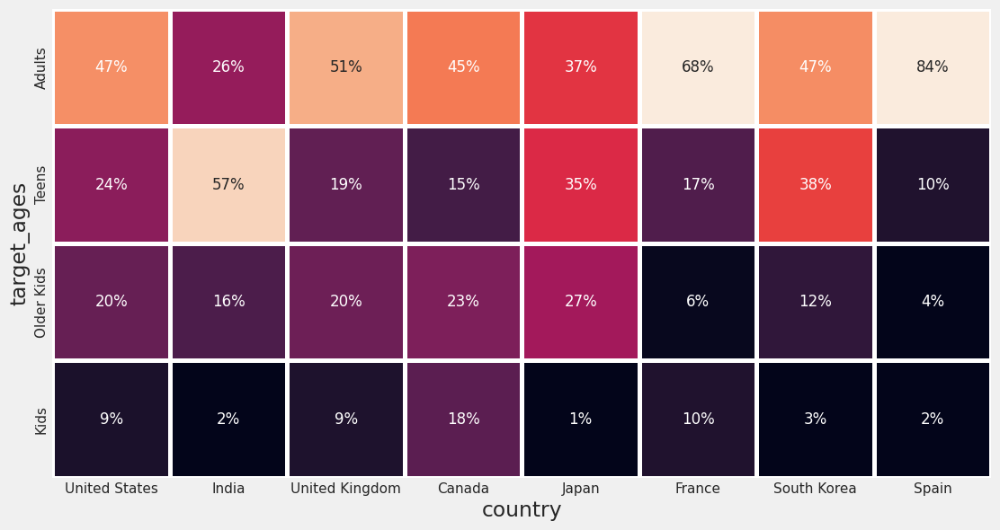

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

country_order2 = ['United States', 'India', 'United Kingdom', 'Canada', 'Japan', 'France', 'South Korea', 'Spain']

age_order = ['Adults', 'Teens', 'Older Kids', 'Kids']

sns.heatmap(df_heatmap.loc[age_order,country_order2],square=True, linewidth=2.5,cbar=False,
            annot=True,fmt='1.0%',vmax=.6,vmin=0.05,ax=ax,annot_kws={"fontsize":12})

plt.show()

##### 1. Why did you pick the specific chart?

To visualize the distribution of the target_ages column across the top 10 countries with the most content on Netflix.

##### 2. What is/are the insight(s) found from the chart?

US and UK are closely aligned with their Netflix target ages, means that people in both USA and UK prefer to watch similar type of content.

In similar way US and Canada are also highly aligned with their Netflix target ages.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

By looking at this heatmap, we can gain insights into how the content preferences of viewers in different countries may differ based on their age group, which can help inform content acquisition and localization strategies for Netflix.

#### Chart - 15 - Pair Plot

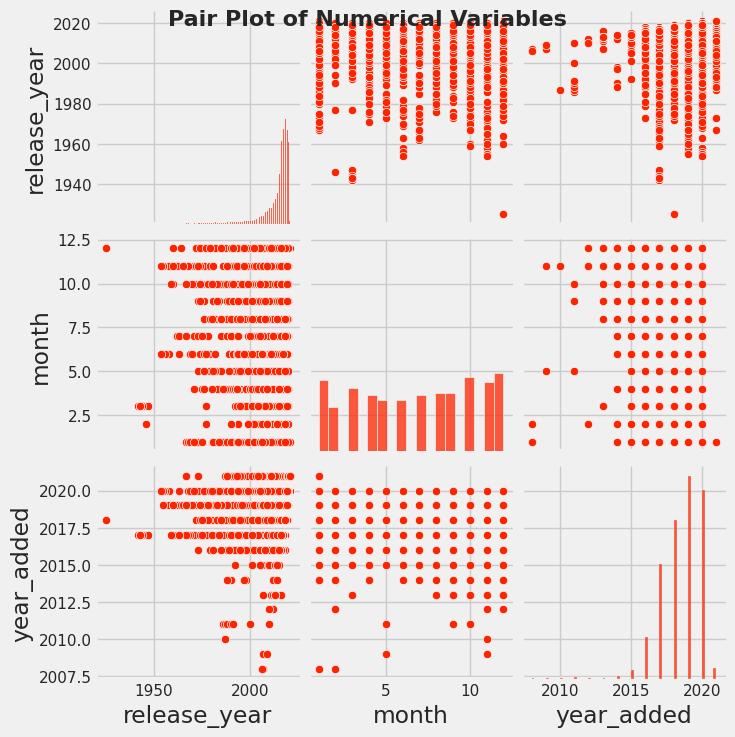

In [ ]:
# Pair Plot visualization code
numerical_columns = ['release_year', 'month', 'year_added']
sns.pairplot(data[numerical_columns])
plt.suptitle("Pair Plot of Numerical Variables", fontweight='bold', fontsize=16)
plt.show()

##### 1. Why did you pick the specific chart?

 A pair plot can be used to quickly visualize relationships between these numerical columns

##### 2. What is/are the insight(s) found from the chart?

The pair plot, which visualized relationships between the numerical variables 'release_year', 'month', and 'year_added', did not reveal any significant or notable patterns or correlations among these features in the dataset.

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [ ]:
# Handling Missing Values & Missing Value Imputation
data.isnull().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
month           0
year_added      0
target_ages     0
count           0
dtype: int64

#### What all missing value imputation techniques have you used and why did you use those techniques?

All the null values in our dataset are handled till now.

### 4. Textual Data Preprocessing
(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

In [ ]:
#merging all text column to single text column to work with

data['organized'] =  data['description'] + ' ' + data['listed_in'] + ' ' + data['target_ages'] + ' ' + data['country']+ ' ' + data['cast'] + ' '+ data['director']

In [ ]:
#filled all the missing value with empty strings
data['organized'] = data['organized'].fillna("")

In [ ]:
import re
def cleaned(x):
    return re.sub(r"[^a-zA-Z ]","",str(x))   #to remove all non-alphabetic characters
data['organized'] = data['organized'].apply(cleaned)

#### 2. Lower Casing

In [ ]:
# Lower Casing
data['organized']= data['organized'].str.lower()

#### 3. Removing Punctuations

In [ ]:
# Remove Punctuations
import string

def remove_punctuation(text):
    # Create a translation table to remove punctuation using the string module
    translator = str.maketrans('', '', string.punctuation)
    # Apply the translation table to remove punctuation from the text
    text = text.translate(translator)
    return text

In [ ]:
data['organized'].apply(remove_punctuation)

0       in a future where the elite inhabit an island ...
1       after a devastating earthquake hits mexico cit...
2       when an army recruit is found dead his fellow ...
3       in a postapocalyptic world ragdoll robots hide...
4       a brilliant group of students become cardcount...
                              ...                        
7782    when lebanons civil war deprives zozo of his f...
7783    a scrappy but poor boy worms his way into a ty...
7784    in this documentary south african rapper nasty...
7785    dessert wizard adriano zumbo looks for the nex...
7786    this documentary delves into the mystique behi...
Name: organized, Length: 7770, dtype: object

#### 5. Removing Stopwords & Removing White spaces

In [ ]:
# Remove Stopwords
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem.snowball import SnowballStemmer

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
def remove_stopwords(text):
    # Tokenizing the text into words
    words = nltk.word_tokenize(text)
    # Removing stopwords from the list of words
    words = [word for word in words if word.lower() not in stopwords.words('english')]
    # Joining the remaining words back into a single string
    text = ' '.join(words)
    return text

In [ ]:
data['organized'].apply(remove_stopwords)

0       future elite inhabit island paradise far crowd...
1       devastating earthquake hits mexico city trappe...
2       army recruit found dead fellow soldiers forced...
3       postapocalyptic world ragdoll robots hide fear...
4       brilliant group students become cardcounting e...
                              ...                        
7782    lebanons civil war deprives zozo family hes le...
7783    scrappy poor boy worms way tycoons dysfunction...
7784    documentary south african rapper nasty c hits ...
7785    dessert wizard adriano zumbo looks next willy ...
7786    documentary delves mystique behind bluesrock t...
Name: organized, Length: 7770, dtype: object

#### 8. Text Normalization

In [ ]:
# Normalizing Text (i.e., Stemming, Lemmatization etc.)
#stemming
stemmer = SnowballStemmer('english')
stop_words = set(stopwords.words('english'))

In [ ]:
def stem_text(text):
    words = nltk.word_tokenize(text)  # tokenizing the text into words
    stemmed_words = [stemmer.stem(word) for word in words]  # applying the Snowball stemmer to each word
    return ' '.join(stemmed_words)  # joining the stemmed words back into a single string

# Apply the stem_text function to a column of a pandas DataFrame, such as a column called 'text'
data['org_new'] = data['organized'].apply(stem_text)

In [ ]:
data.org_new

0       in a futur where the elit inhabit an island pa...
1       after a devast earthquak hit mexico citi trap ...
2       when an armi recruit is found dead his fellow ...
3       in a postapocalypt world ragdol robot hide in ...
4       a brilliant group of student becom cardcount e...
                              ...                        
7782    when lebanon civil war depriv zozo of his fami...
7783    a scrappi but poor boy worm his way into a tyc...
7784    in this documentari south african rapper nasti...
7785    dessert wizard adriano zumbo look for the next...
7786    this documentari delv into the mystiqu behind ...
Name: org_new, Length: 7770, dtype: object

#### 10. Text Vectorization

In [ ]:
new_df = data[['title', 'org_new']]

In [ ]:
new_df.head()

,title,org_new
0,3%,in a futur where the elit inhabit an island pa...
1,7:19,after a devast earthquak hit mexico citi trap ...
2,23:59,when an armi recruit is found dead his fellow ...
3,9,in a postapocalypt world ragdol robot hide in ...
4,21,a brilliant group of student becom cardcount e...


In [ ]:
#using tfidf
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
t_vectorizer = TfidfVectorizer(max_features=20000)
X= t_vectorizer.fit_transform(new_df['org_new'])

In [ ]:
X.shape

(7770, 20000)

Here we have used Tf-idf vectorization beacause it takes into account the importance of each word in a document. TF-IDF also assigns higher values to rare words that are unique to a particular document, making them more important in the representation.

### 7. Dimesionality Reduction using PCA

In [ ]:
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(X.toarray())

PCA()

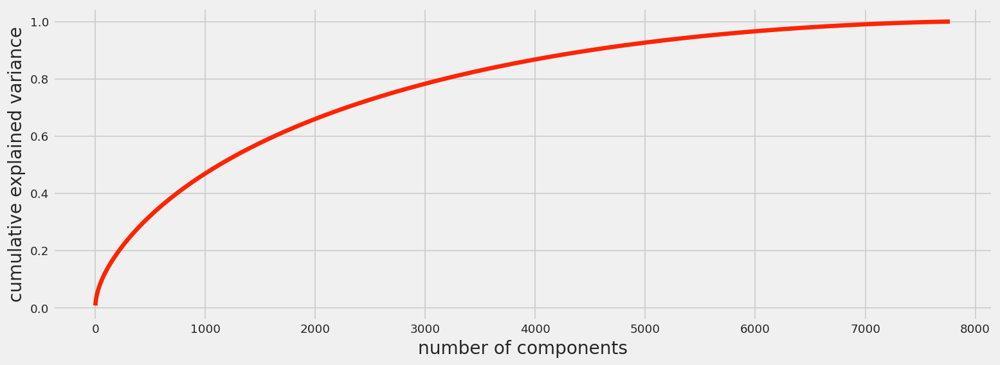

In [ ]:
plt.figure(figsize=(14,5), dpi=120)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()


We can see from the above plot almost 95% of the variance can be explained by 5000 components.

Since choosing 5000 could be tricky we will set the value to be 95% in sklearn.

In [ ]:
pca_tuned = PCA(n_components=0.95)
pca_tuned.fit(X.toarray())
X_transformed = pca_tuned.transform(X.toarray())
X_transformed.shape

(7770, 5538)

#### 1. Expand Contraction

In [ ]:
# Expand Contraction

#### 4. Removing URLs & Removing words and digits contain digits.

In [ ]:
# Remove URLs & Remove words and digits contain digits

In [ ]:
# Remove White spaces

#### 6. Rephrase Text

In [ ]:
# Rephrase Text

#### 7. Tokenization

In [ ]:
# Tokenization

##### Which text normalization technique have you used and why?

Answer Here.

#### 9. Part of speech tagging

In [ ]:
# POS Taging

In [ ]:
# Vectorizing Text

##### Which text vectorization technique have you used and why?

Answer Here.

### 2. Handling Outliers

In [ ]:
# Handling Outliers & Outlier treatments

##### What all outlier treatment techniques have you used and why did you use those techniques?

Answer Here.

### 3. Categorical Encoding

In [ ]:
# Encode your categorical columns

#### What all categorical encoding techniques have you used & why did you use those techniques?

Answer Here.

### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

In [ ]:
# Manipulate Features to minimize feature correlation and create new features

#### 2. Feature Selection

In [ ]:
# Select your features wisely to avoid overfitting

##### What all feature selection methods have you used  and why?

Answer Here.

##### Which all features you found important and why?

Answer Here.

### 5. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

In [ ]:
# Transform Your data

### 6. Data Scaling

In [ ]:
# Scaling your data

##### Which method have you used to scale you data and why?

##### Do you think that dimensionality reduction is needed? Explain Why?

Answer Here.

In [ ]:
# DImensionality Reduction (If needed)

##### Which dimensionality reduction technique have you used and why? (If dimensionality reduction done on dataset.)

Answer Here.

### 8. Data Splitting

In [ ]:
# Split your data to train and test. Choose Splitting ratio wisely.

##### What data splitting ratio have you used and why?

Answer Here.

### 9. Handling Imbalanced Dataset

##### Do you think the dataset is imbalanced? Explain Why.

Answer Here.

In [ ]:
# Handling Imbalanced Dataset (If needed)

##### What technique did you use to handle the imbalance dataset and why? (If needed to be balanced)

Answer Here.

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

Answer Here.

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Answer Here.

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

##### Which statistical test have you done to obtain P-Value?

Answer Here.

##### Why did you choose the specific statistical test?

Answer Here.

### Hypothetical Statement - 2

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Answer Here.

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

##### Which statistical test have you done to obtain P-Value?

Answer Here.

##### Why did you choose the specific statistical test?

Answer Here.

### Hypothetical Statement - 3

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Answer Here.

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

##### Which statistical test have you done to obtain P-Value?

Answer Here.

##### Why did you choose the specific statistical test?

Answer Here.

## ***7. ML Model Implementation***

# **Clustering Analysis**

 ## 1. **Silhoutte Score**

In [ ]:
# ML Model - 1 Implementation

# Fit the Algorithm

# Predict on the model
from sklearn.cluster import KMeans

from yellowbrick.cluster import KElbowVisualizer

model = KMeans(random_state=5)
visualizer = KElbowVisualizer(model, k=(4,22), metric='silhouette', timings=False, locate_elbow=False)

visualizer.fit(X_transformed)
visualizer.show()

In [ ]:
from yellowbrick.cluster import SilhouetteVisualizer

In [ ]:
from sklearn.metrics import silhouette_score, silhouette_samples

def silhouette_score_analysis(n):

  for n_clusters in range(2,n):
      km = KMeans (n_clusters=n_clusters, random_state=5)
      preds = km.fit_predict(X_transformed)
      centers = km.cluster_centers_

      score = silhouette_score(X_transformed, preds, metric='euclidean')
      print ("For n_clusters = {}, silhouette score is {}".format(n_clusters, score))

      visualizer = SilhouetteVisualizer(km)

      visualizer.fit(X_transformed) # Fit the training data to the visualizer
      visualizer.poof() # Draw/show/poof the data

For n_clusters = 2, silhouette score is 0.0045172633896833556


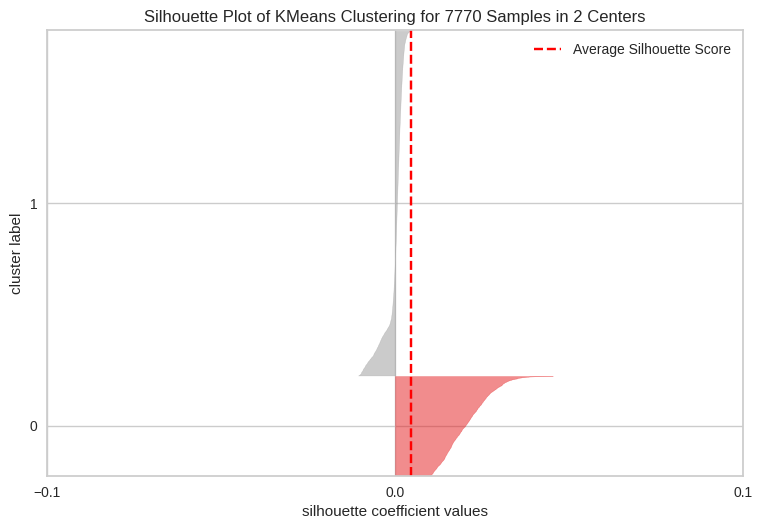

For n_clusters = 3, silhouette score is 0.0038109266448777238


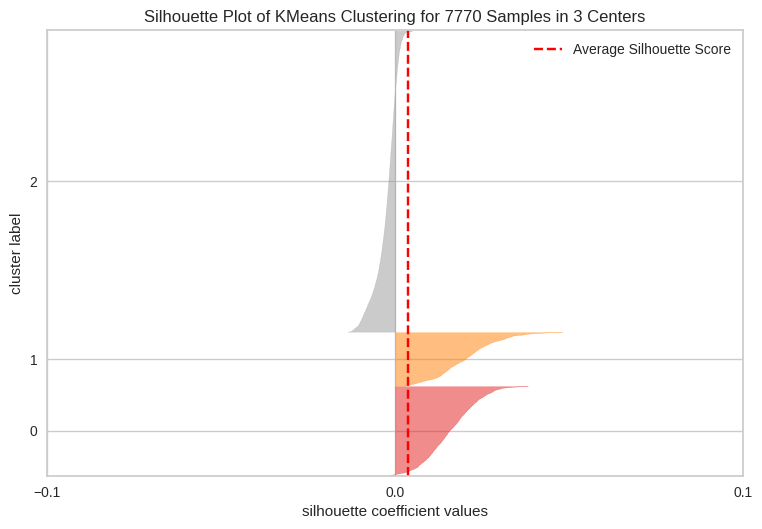

For n_clusters = 4, silhouette score is 0.00488364990301173


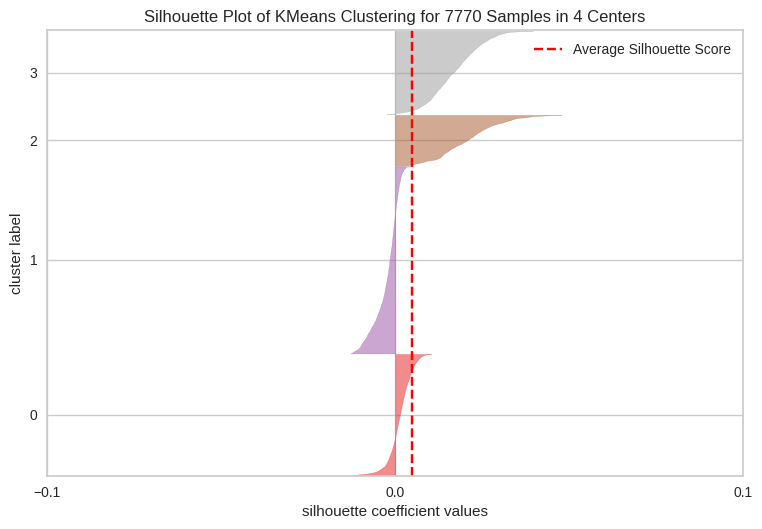

For n_clusters = 5, silhouette score is 0.005971474092150919


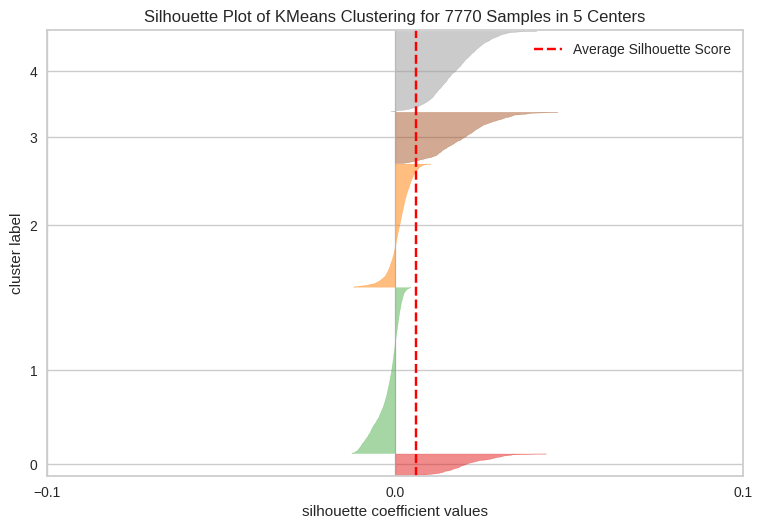

For n_clusters = 6, silhouette score is 0.006381530625764568


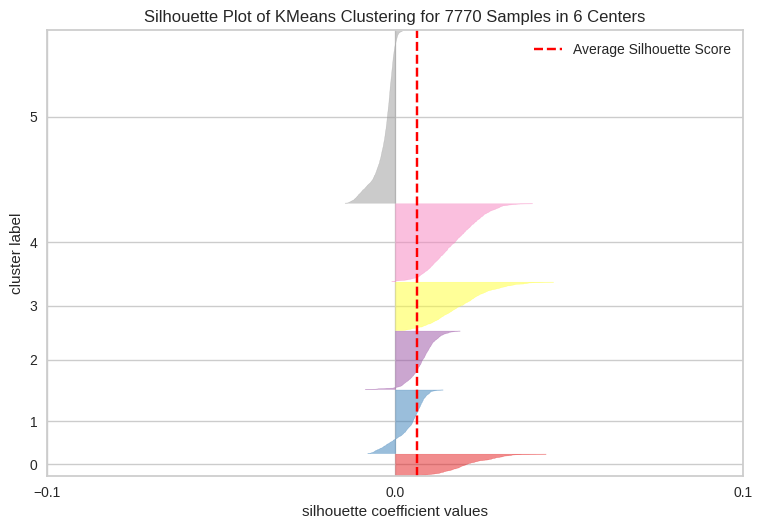

For n_clusters = 7, silhouette score is 0.003409289505093902


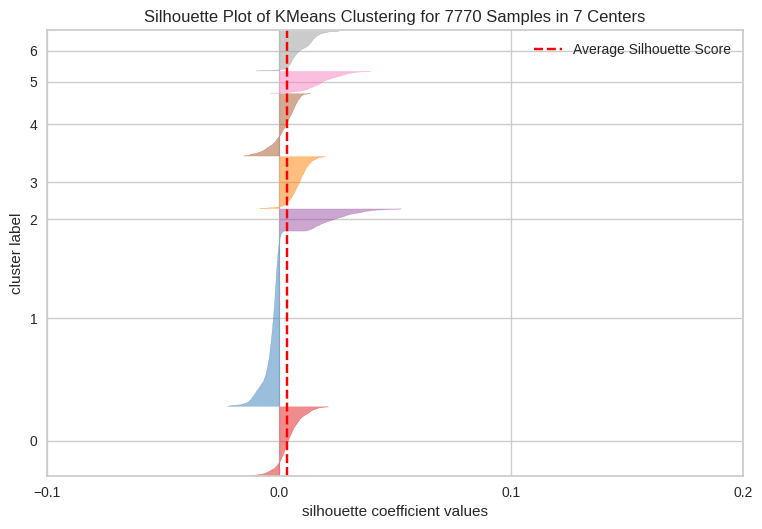

For n_clusters = 8, silhouette score is 0.003427902886816034


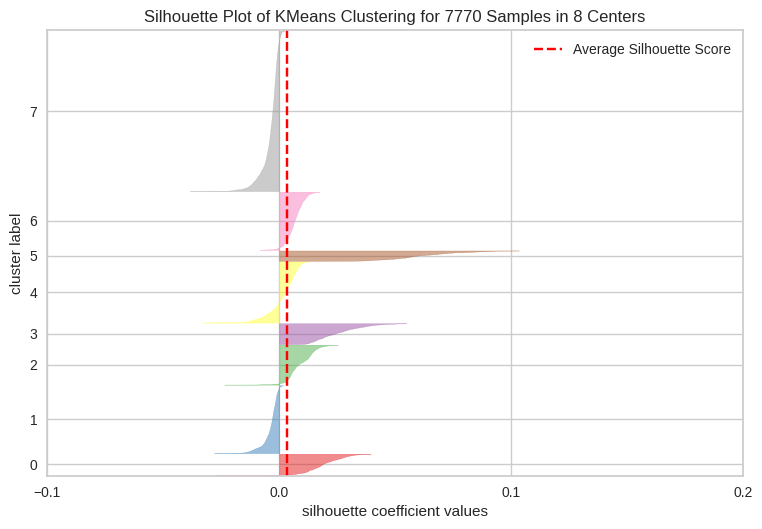

For n_clusters = 9, silhouette score is 0.0039492273900281665


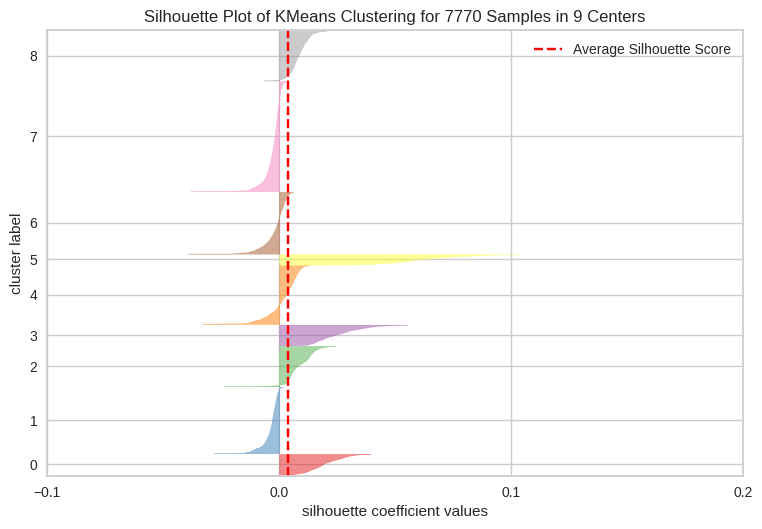

For n_clusters = 10, silhouette score is 0.004215109319345154


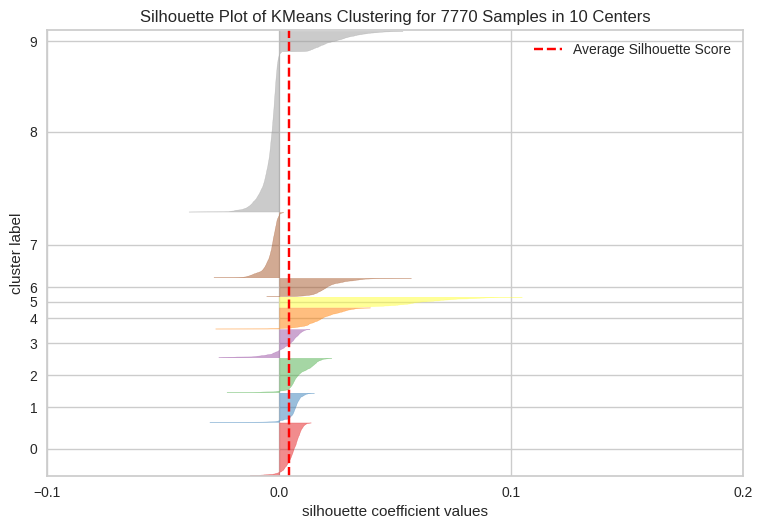

For n_clusters = 11, silhouette score is 0.004725070647007268


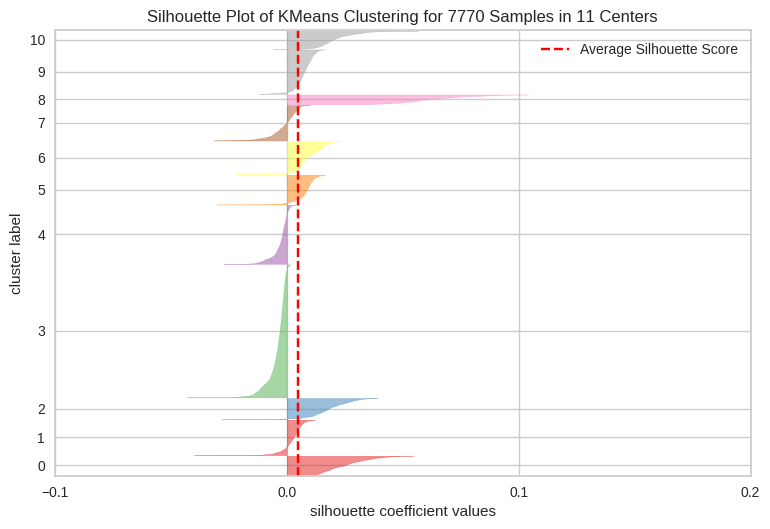

For n_clusters = 12, silhouette score is 0.0050866489644895265


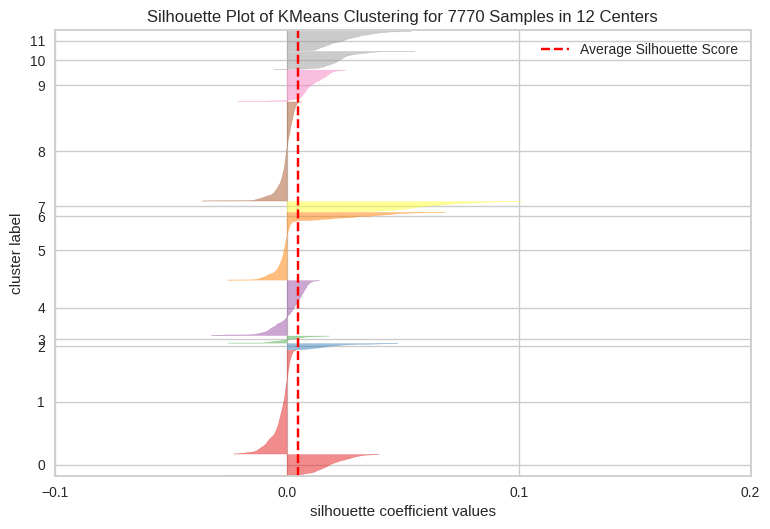

For n_clusters = 13, silhouette score is 0.0052939375670867225


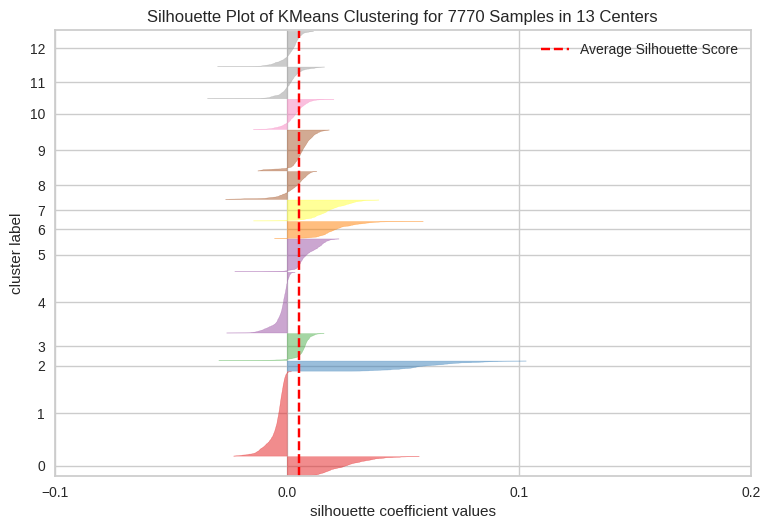

For n_clusters = 14, silhouette score is 0.004752711089744786


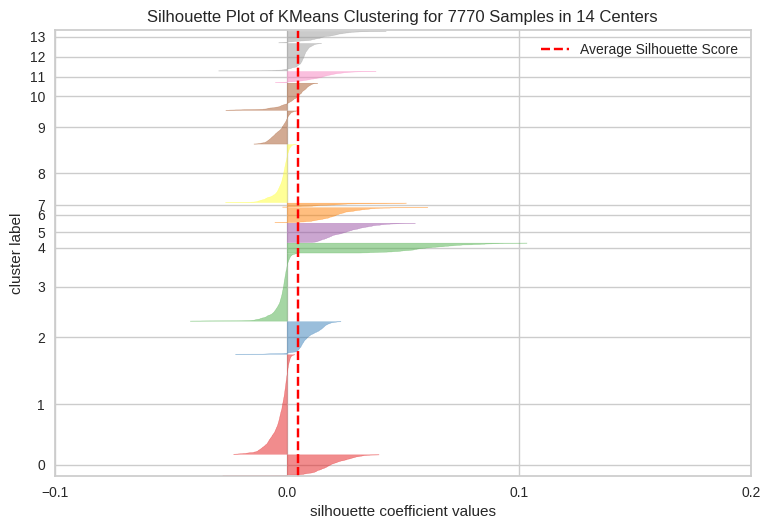

For n_clusters = 15, silhouette score is 0.005847581248579231


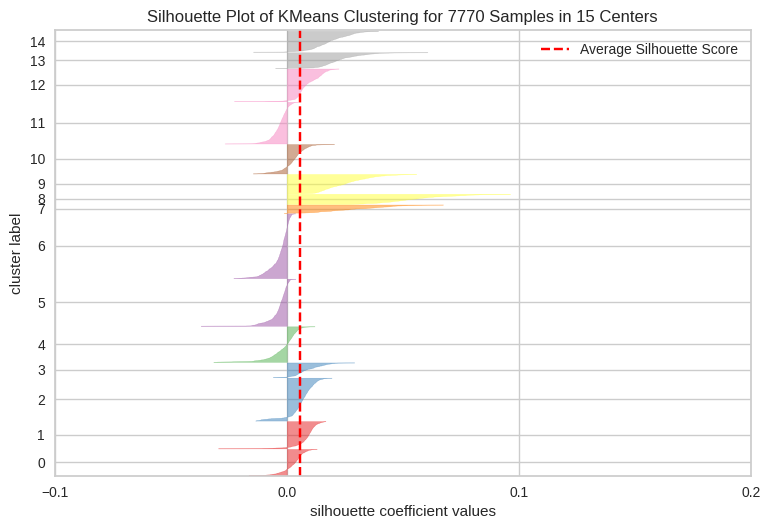

For n_clusters = 16, silhouette score is 0.006152989339923362


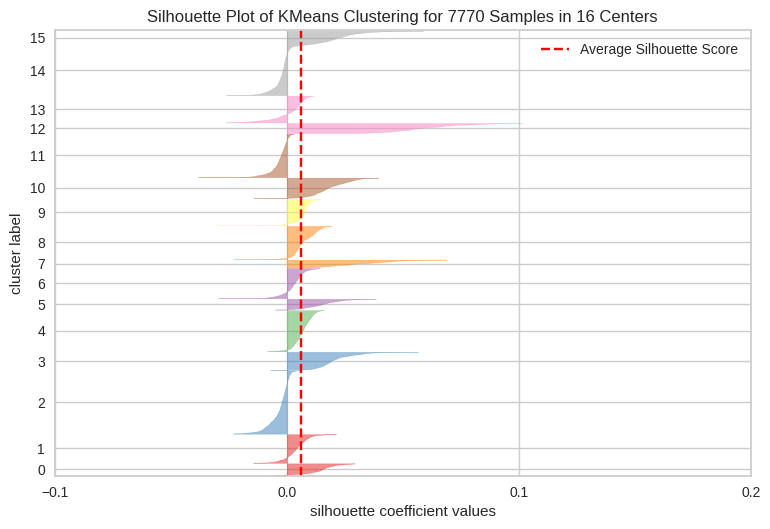

For n_clusters = 17, silhouette score is 0.006408624077399751


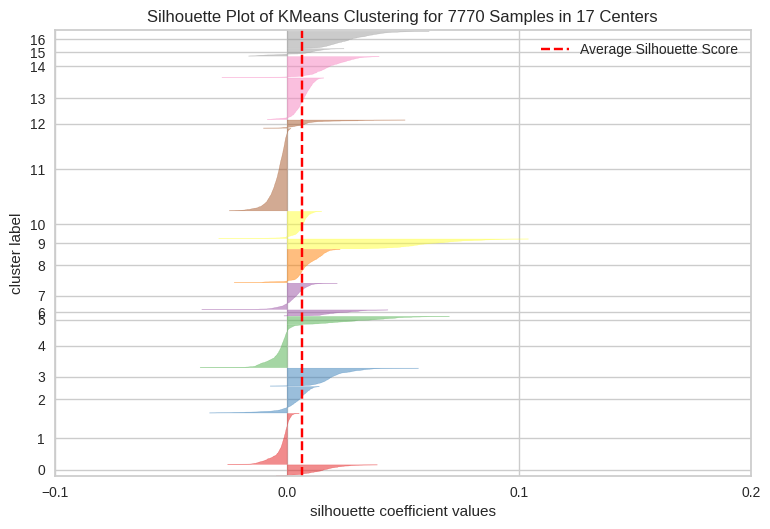

For n_clusters = 18, silhouette score is 0.006446619485199065


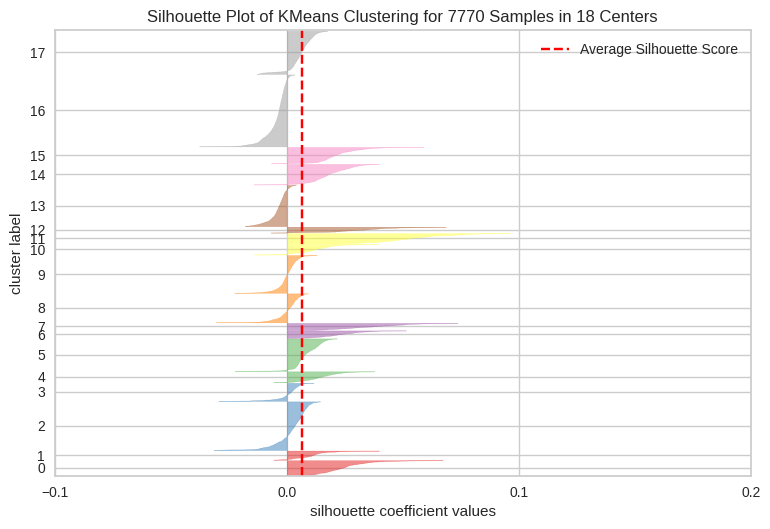

For n_clusters = 19, silhouette score is 0.005587500522651748


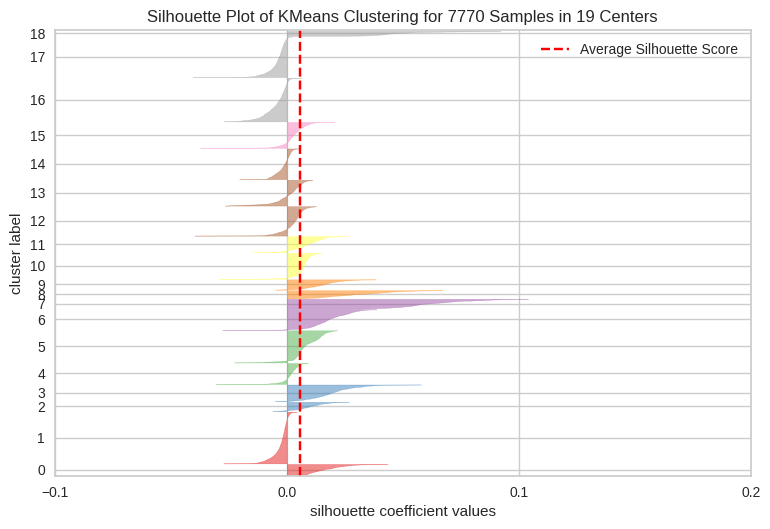

For n_clusters = 20, silhouette score is 0.005196571930486569


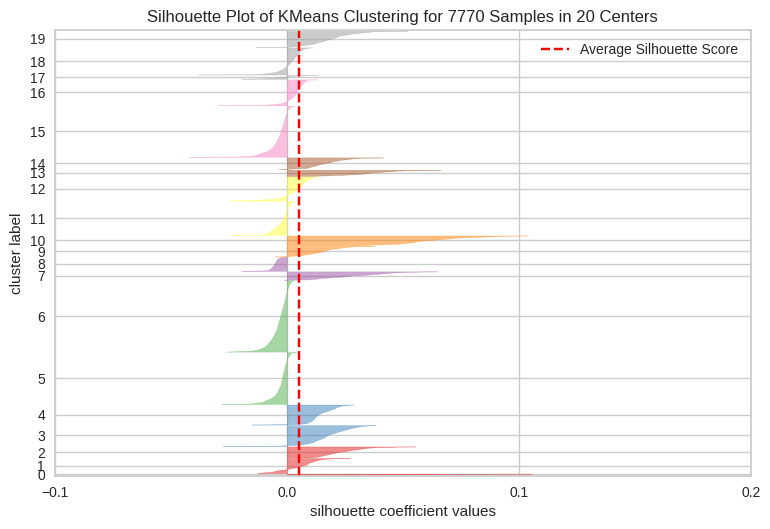

For n_clusters = 21, silhouette score is 0.0060905710509453655


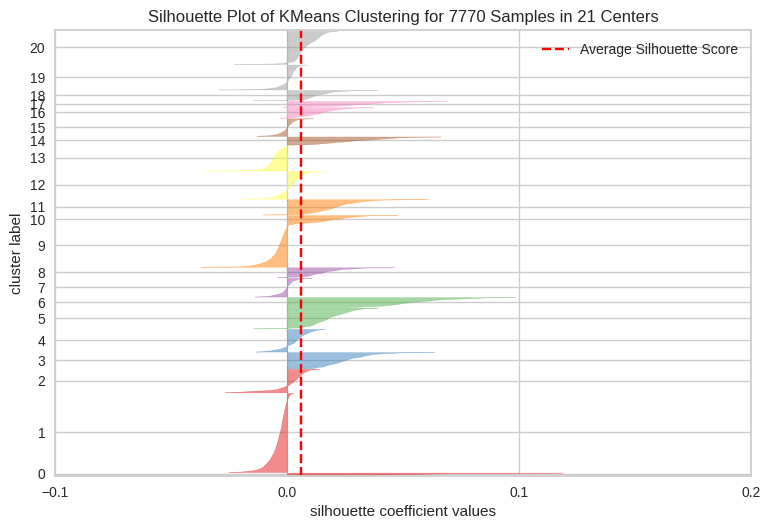

In [ ]:
silhouette_score_analysis(22)

Silhouette score is a metric used to evaluate the quality of clustering results. It measures how similar an object is to its own cluster (cohesion) compared to other clusters (separation). A silhouette score ranges from -1 to 1, with higher scores indicating better clustering.

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [ ]:
# Visualizing evaluation Metric Score chart

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)

# Fit the Algorithm

# Predict on the model

##### Which hyperparameter optimization technique have you used and why?

Answer Here.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Answer Here.

 ## 2.  **Elbow Method**

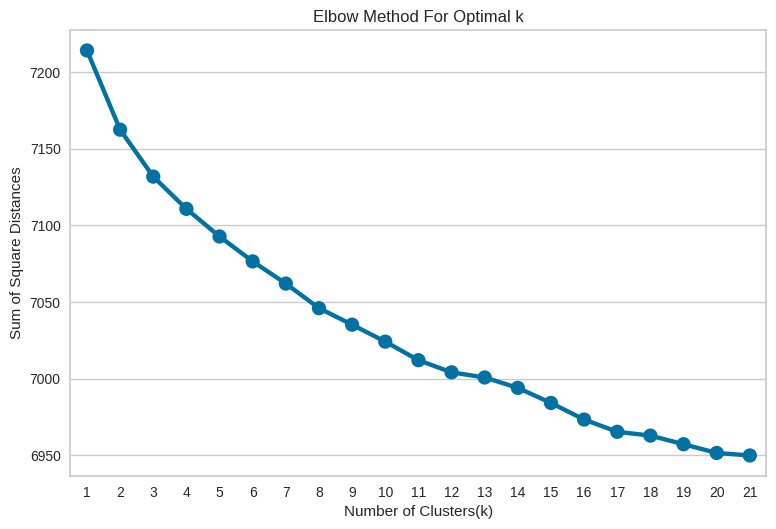

In [ ]:
sum_of_sq_dist = {}
for k in range(1,22):
    km = KMeans(n_clusters= k, init= 'k-means++', max_iter= 300, n_init=10, random_state=0)
    km = km.fit(X_transformed)
    sum_of_sq_dist[k] = km.inertia_

#Plot the graph for the sum of square distance values and Number of Clusters
sns.pointplot(x = list(sum_of_sq_dist.keys()), y = list(sum_of_sq_dist.values()))
plt.xlabel('Number of Clusters(k)')
plt.ylabel('Sum of Square Distances')
plt.title('Elbow Method For Optimal k')
plt.show()

The elbow method is a common technique used to determine the optimal number of clusters in a dataset. The method involves plotting the within-cluster sum of squares (WSS) for different numbers of clusters and identifying the "elbow" point on the plot, which represents the point of diminishing returns in terms of increasing the number of clusters. Here the number of cluster corresponding to the lower wss score is selected.



Here we will select the number of clusters as 10, as no drastic difference is visible after that.


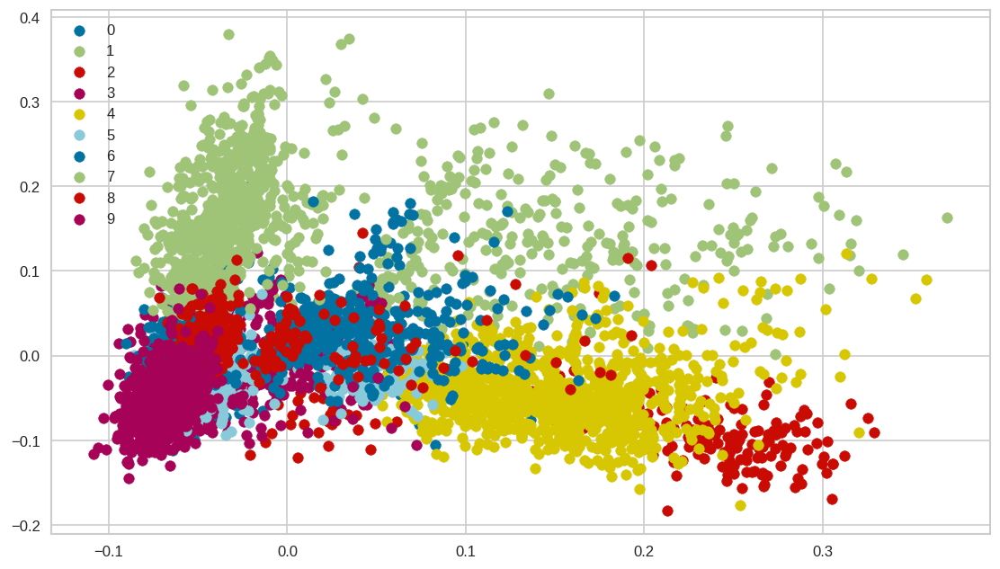

In [ ]:
plt.figure(figsize=(10,6), dpi=120)

kmeans= KMeans(n_clusters=10, init= 'k-means++', random_state=9)
kmeans.fit(X_transformed)

#predict the labels of clusters.
label = kmeans.fit_predict(X_transformed)
#Getting unique labels
unique_labels = np.unique(label)

#plotting the results:
for i in unique_labels:
    plt.scatter(X_transformed[label == i , 0] , X_transformed[label == i , 1] , label = i)
plt.legend()
plt.show()

In [ ]:
# Add cluster values to the dateframe.
data['cluster_number'] = kmeans.labels_

We have created a new column called "cluster_number," which indicates which observations are assigned to which cluster.

In [ ]:
data.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,month,year_added,target_ages,count,organized,org_new,cluster_number
0,s1,TV Show,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,8,2020,Adults,1,in a future where the elite inhabit an island ...,in a futur where the elit inhabit an island pa...,4
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,12,2016,Adults,1,after a devastating earthquake hits mexico cit...,after a devast earthquak hit mexico citi trap ...,3
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",12,2018,Adults,1,when an army recruit is found dead his fellow ...,when an armi recruit is found dead his fellow ...,3
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",11,2017,Teens,1,in a postapocalyptic world ragdoll robots hide...,in a postapocalypt world ragdol robot hide in ...,5
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,1,2020,Teens,1,a brilliant group of students become cardcount...,a brilliant group of student becom cardcount e...,3


In [ ]:
#word cloud for user rating review
def func_select_Category(cluster_label,column_of_choice):
  df_word_cloud = data[['cluster_number',column_of_choice]].dropna()
  df_word_cloud = df_word_cloud[df_word_cloud['cluster_number']==cluster_label]
  text = " ".join(word for word in df_word_cloud[column_of_choice])
  # Create stopword list:
  stopwords = set(STOPWORDS)
  # Generate a word cloud image
  wordcloud = WordCloud(stopwords=stopwords, background_color="black").generate(text)
  # Plot the wordclouds
  plt.imshow(wordcloud, interpolation='blackman')
  plt.title(f'Cluster: {i}', fontsize=18, fontweight='bold')
  plt.axis("off")
  plt.show()

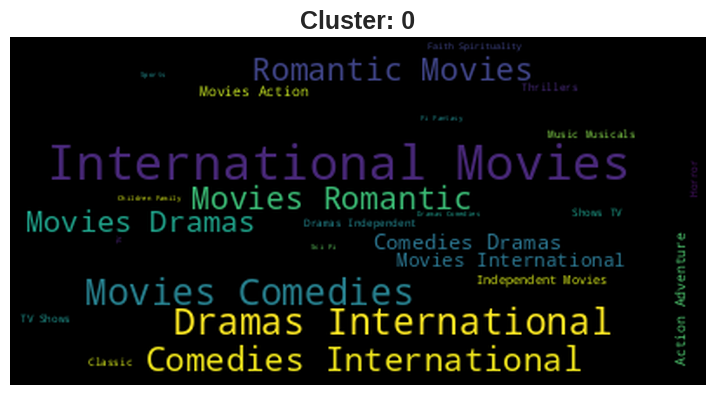

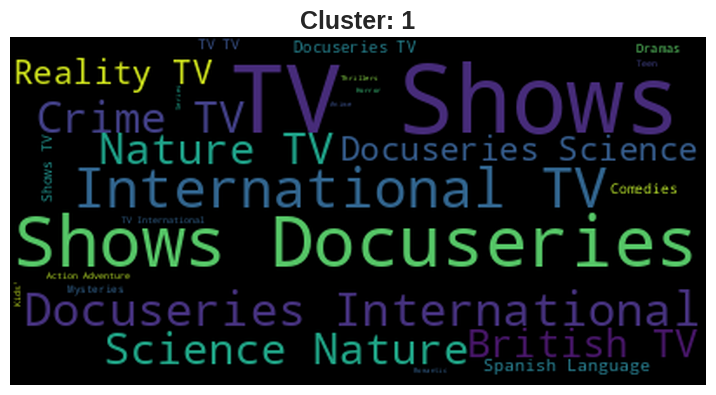

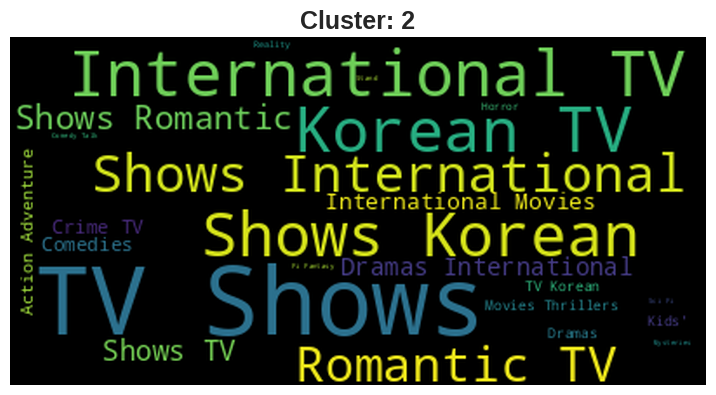

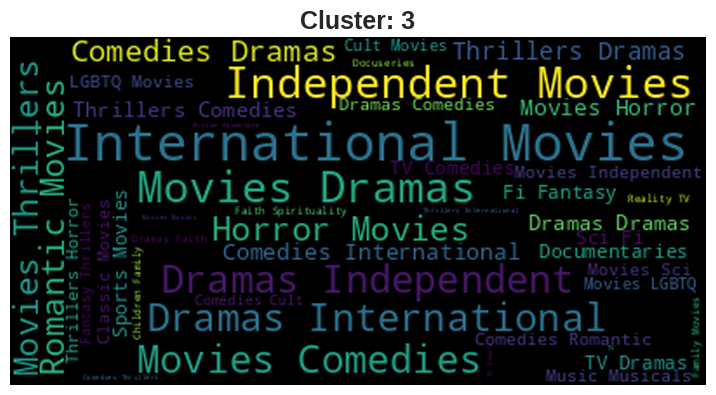

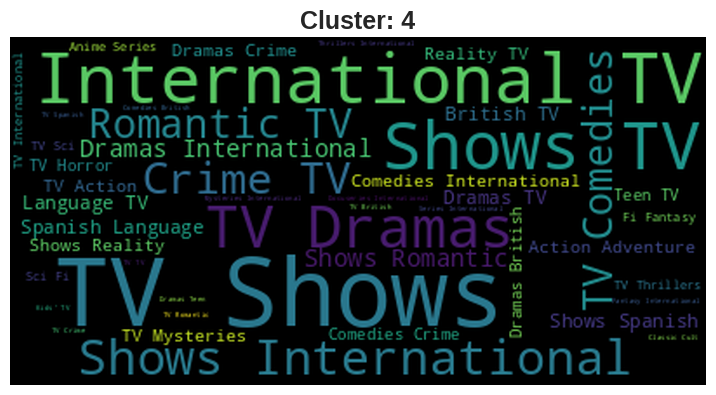

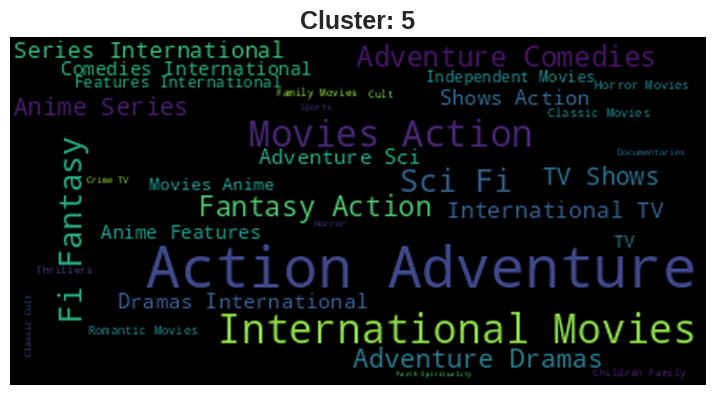

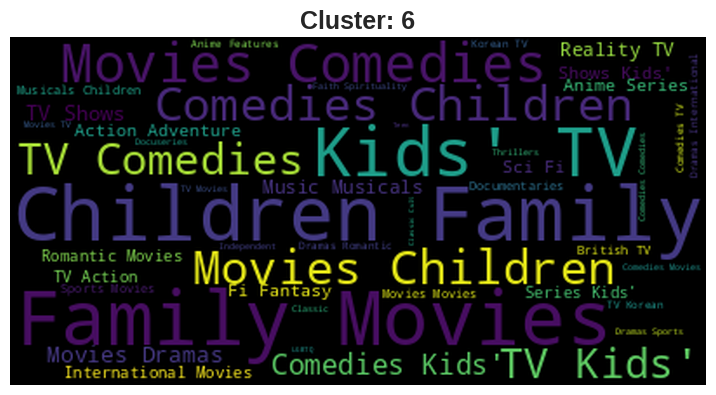

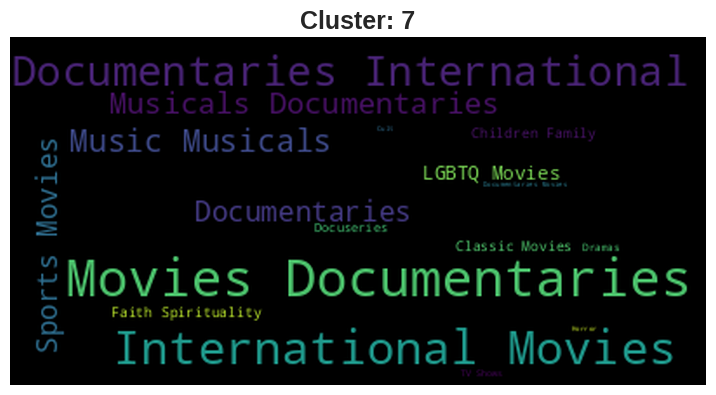

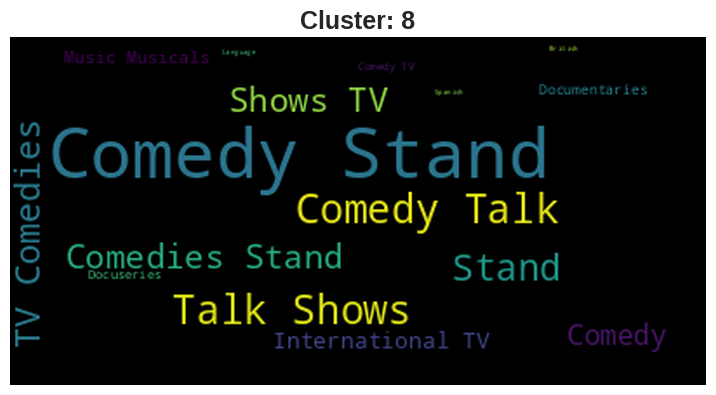

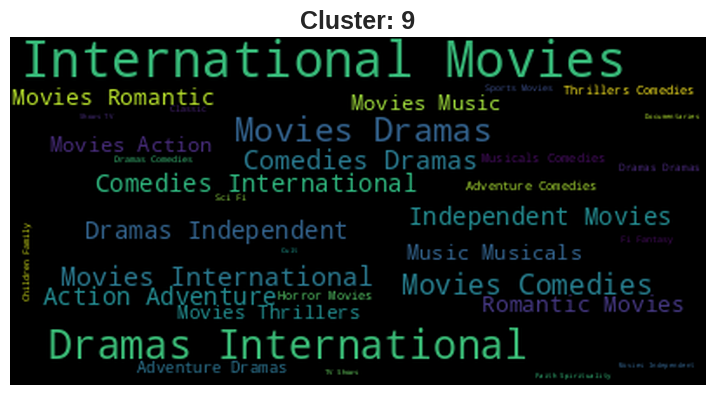

In [ ]:
for i in range(10):
  func_select_Category(i,'listed_in')

* Above we have built word cloud for our variable named 'listed_in' in different clusters, and we can see that there are different types of genres dominating in different clusters. For eg-: cluster 0  is about comedy and drama, cluster 4 is about tv shows, cluster 1 is about science and international movies, cluster 5 is about adventure, fantasy and action.

* This Clustering can help in content recommendation: Clustering can be used to recommend content to viewers based on their preferences. For example, if a viewer prefers science and international movies, the recommendation system can suggest movies from cluster 1.

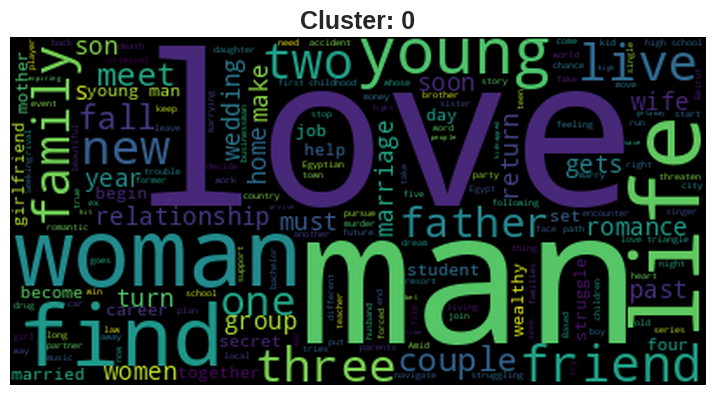

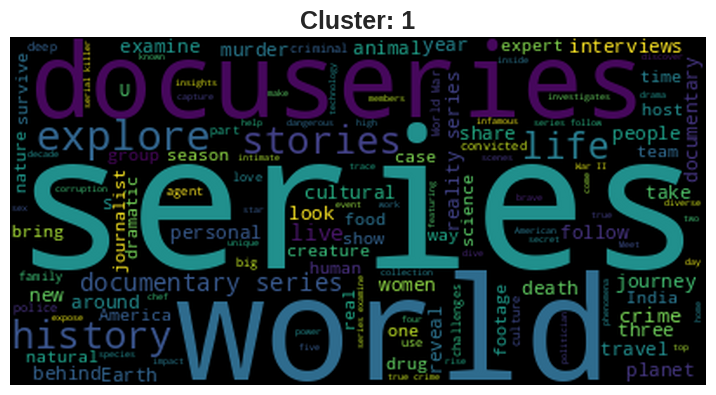

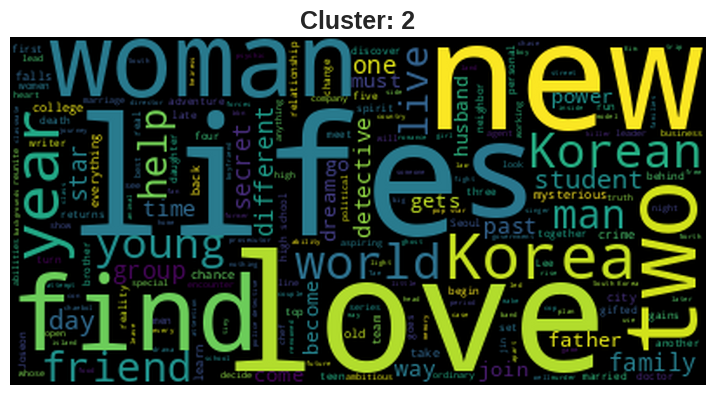

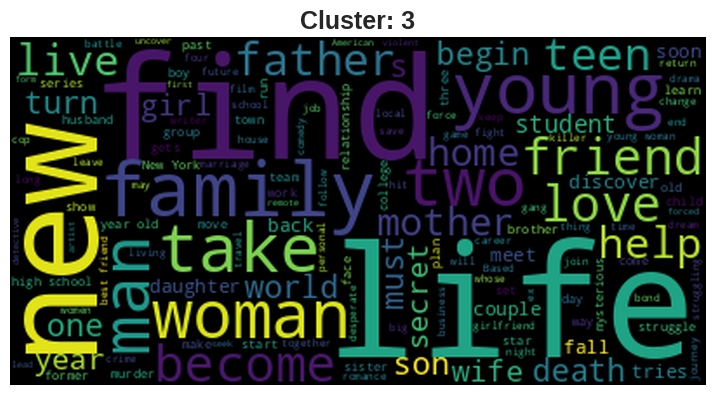

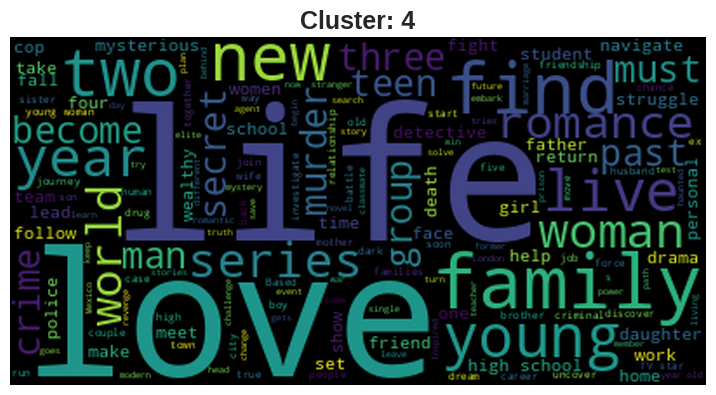

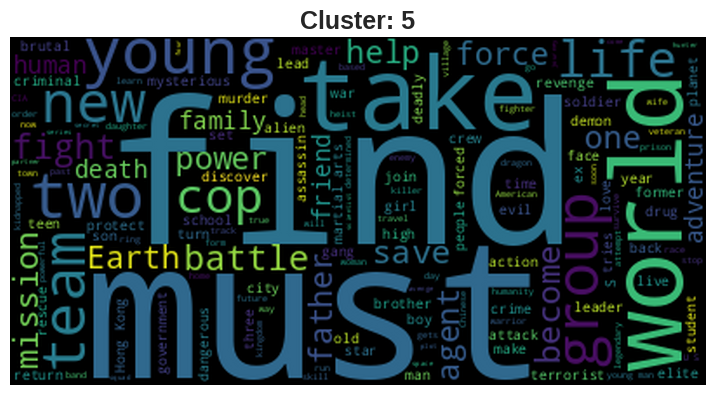

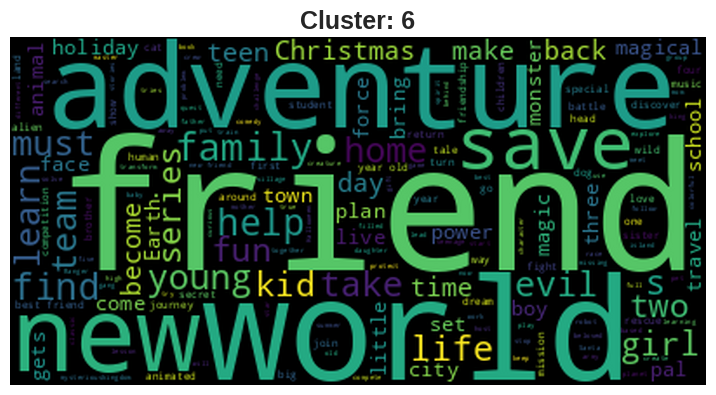

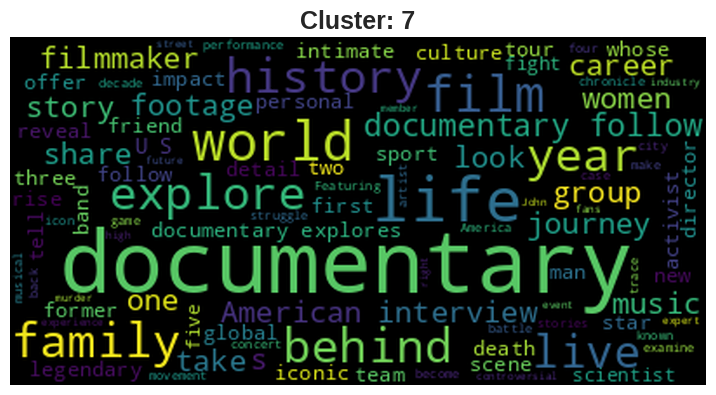

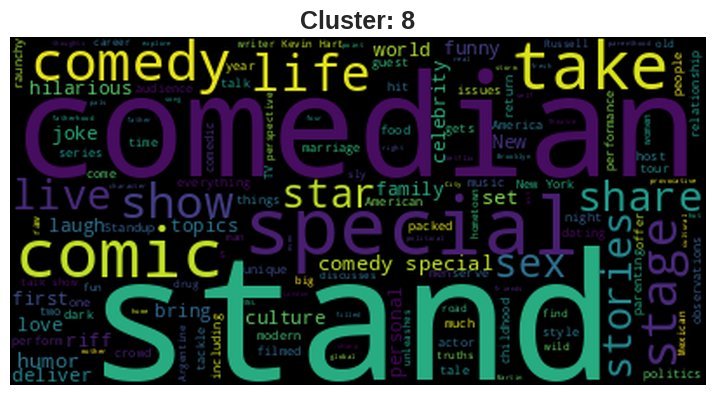

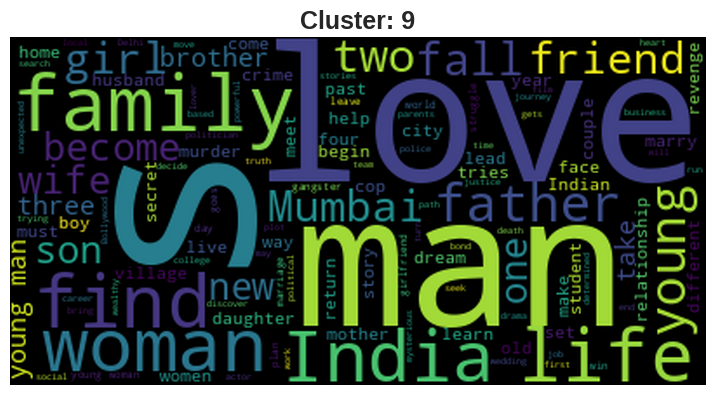

In [ ]:
for i in range(10):
  func_select_Category(i,'description')

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [ ]:
# Visualizing evaluation Metric Score chart

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)

# Fit the Algorithm

# Predict on the model

##### Which hyperparameter optimization technique have you used and why?

Answer Here.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Answer Here.

#### 3. Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

Answer Here.

## 3. **Dendogram**

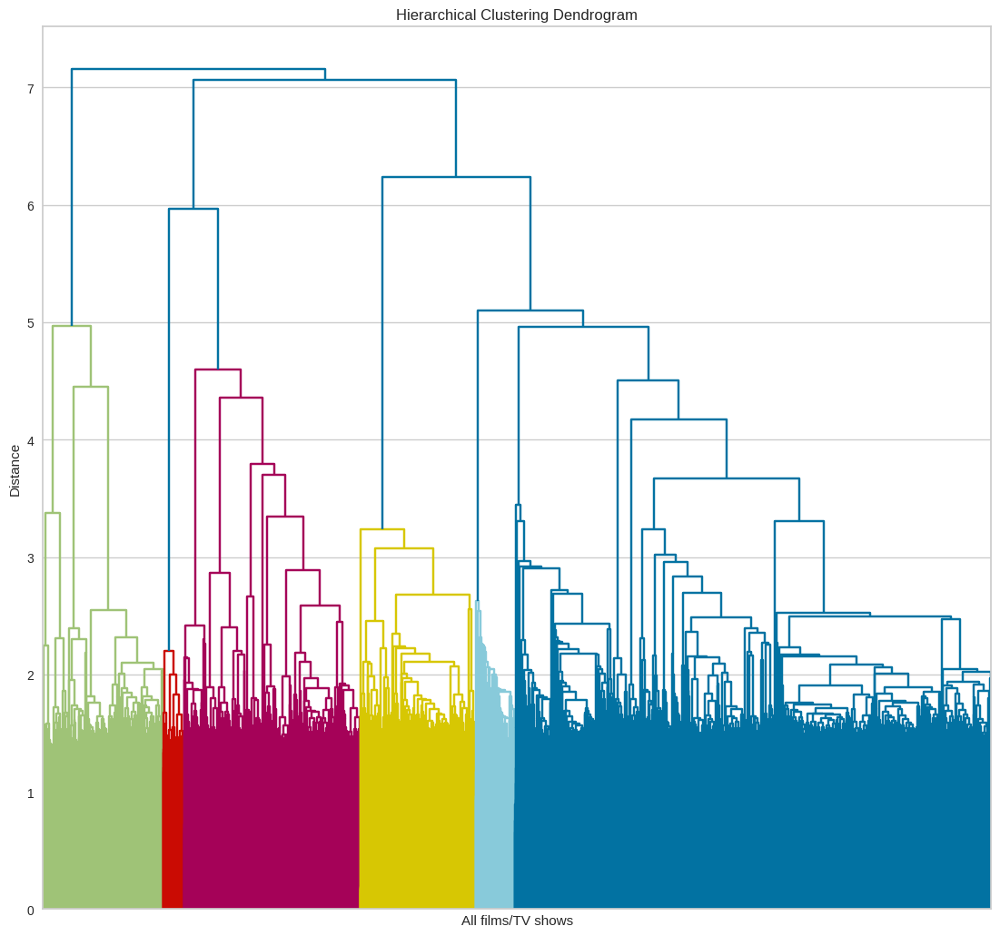

In [ ]:
# ML Model - 3 Implementation

# Fit the Algorithm

# Predict on the model
from scipy.cluster.hierarchy import linkage, dendrogram

# HIERARCHICAL CLUSTERING
distances_linkage = linkage(X_transformed,
                            method = 'ward',
                            metric = 'euclidean')

plt.figure(figsize=(12, 12))

plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('All films/TV shows')
plt.ylabel('Distance')

dendrogram(
    distances_linkage,
    no_labels = True
)

plt.show()



A dendrogram is a tree-like diagram used to display the relationships between data points in a hierarchical clustering algorithm. It displays the distance between each pair of data points and how they are grouped into clusters.

We used Dendrogram because dendrograms are a useful tool for visualizing hierarchical clustering results.


## 4. **Agglomerative Clustering**

In [ ]:
from sklearn.cluster import AgglomerativeClustering
k_range = range(5, 12)

In [ ]:
for k in k_range:
    model = AgglomerativeClustering(n_clusters=k)
    labels = model.fit_predict(X_transformed)
    score = silhouette_score(X, labels)
    print("k=%d, Silhouette score=%f" % (k, score))

k=5, Silhouette score=0.001577
k=6, Silhouette score=0.002002
k=7, Silhouette score=0.000878
k=8, Silhouette score=0.001343
k=9, Silhouette score=0.001917
k=10, Silhouette score=0.002299
k=11, Silhouette score=0.002145


Here, we have the same number of clusters in k-means elbow method and agglomerative clustering i.e. 10, it means that both methods agreed on the optimal number of clusters for the given data. This might be a good sign that the chosen number of clusters is a good fit for the data.

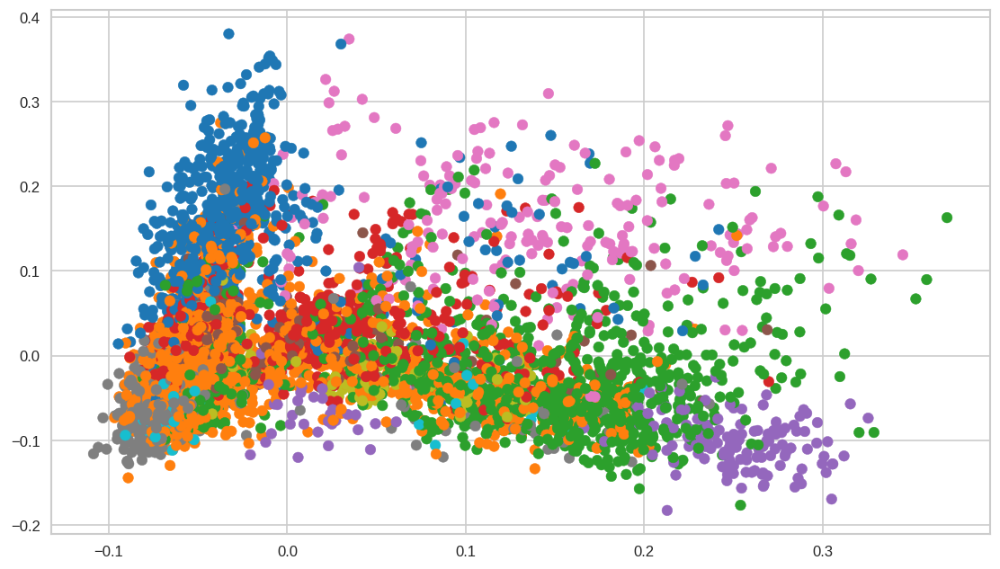

In [ ]:
from sklearn.cluster import AgglomerativeClustering
model = AgglomerativeClustering(n_clusters = 10, affinity = 'euclidean', linkage = 'ward')
labels = model.fit_predict(X_transformed)
# Create a scatter plot with different colors for different clusters
plt.figure(figsize=(10,6), dpi=120)
plt.scatter(X_transformed[:, 0], X_transformed[:, 1], c=labels, cmap='tab10')
plt.legend()
plt.show()

We have created a new column called "cluster_number_agg_clustering," which indicates which observations are assigned to which cluster.

In [ ]:
data['cluster_number_agg_clustering'] = model.labels_

In [ ]:
def func_select_Category_agg_clustering(cluster_label,column_of_choice):
  df_word_cloud = data[['cluster_number_agg_clustering',column_of_choice]].dropna()
  df_word_cloud = df_word_cloud[df_word_cloud['cluster_number_agg_clustering']==cluster_label]
  text = " ".join(word for word in df_word_cloud[column_of_choice])
  # Create stopword list:
  stopwords = set(STOPWORDS)
  # Generate a word cloud image
  wordcloud = WordCloud(stopwords=stopwords, background_color="black").generate(text)
  # Plot the wordclouds
  plt.imshow(wordcloud, interpolation='blackman')
  plt.title(f'Cluster: {i}', fontsize=18, fontweight='bold')
  plt.axis("off")
  plt.show()

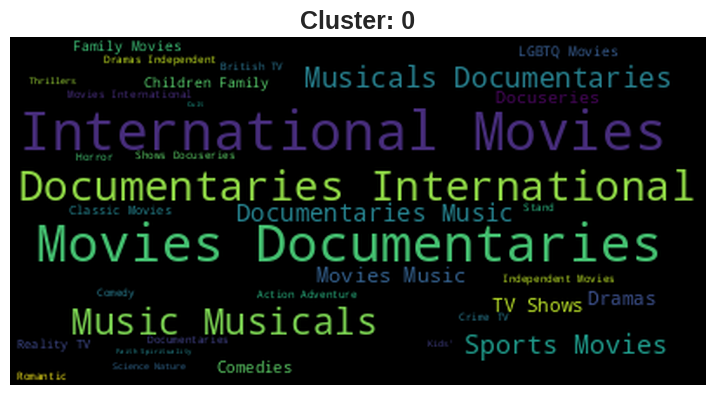

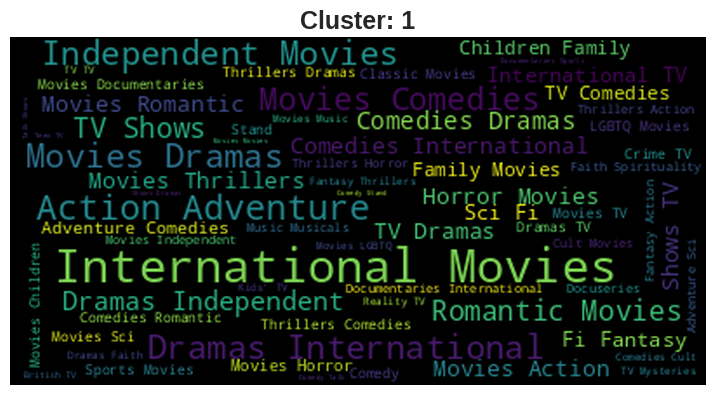

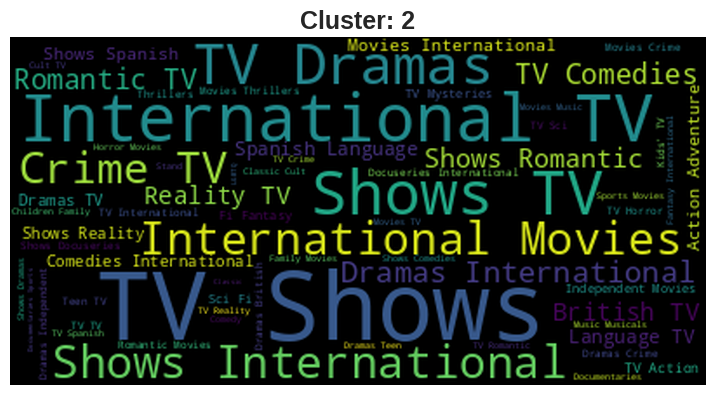

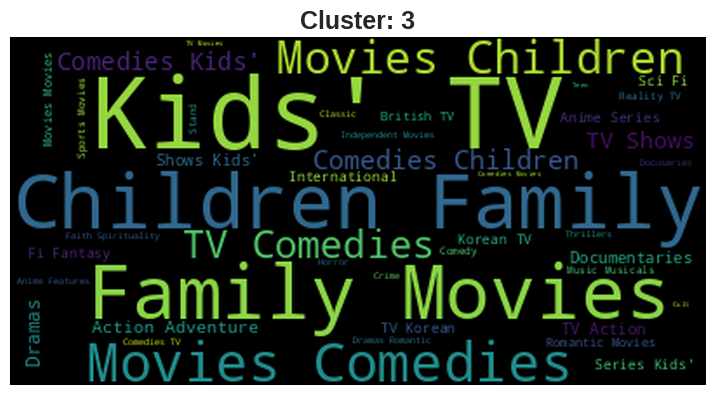

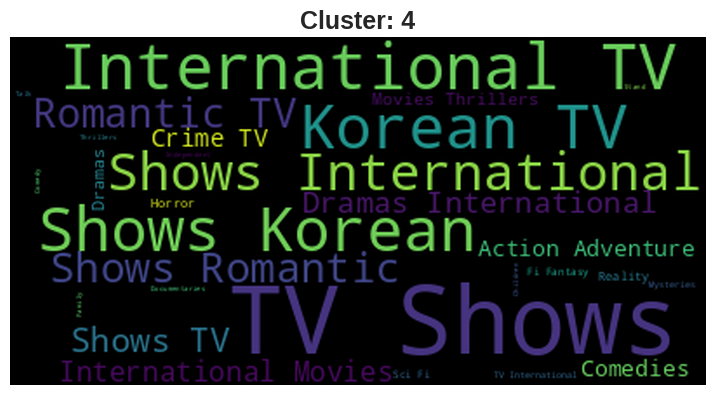

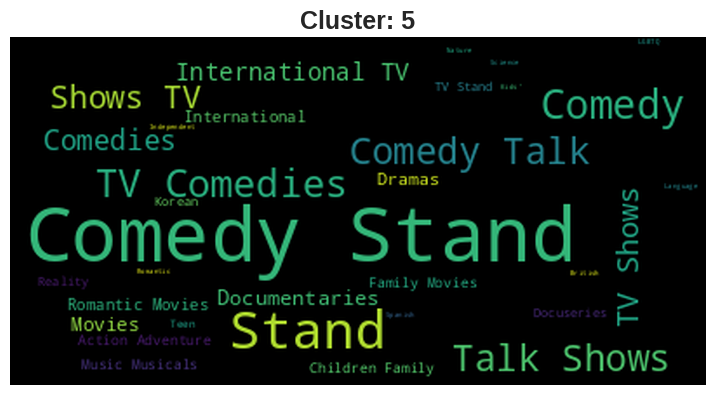

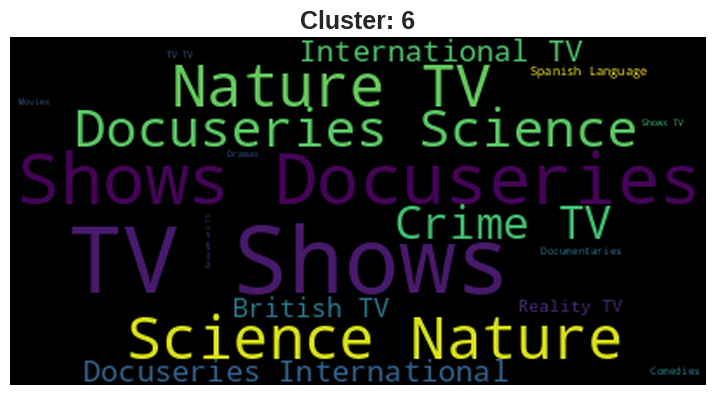

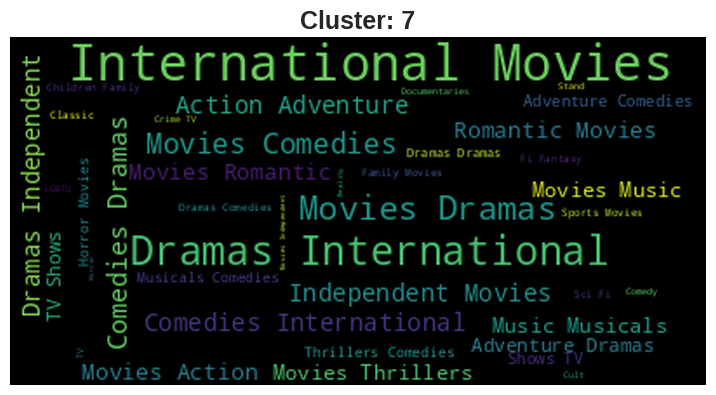

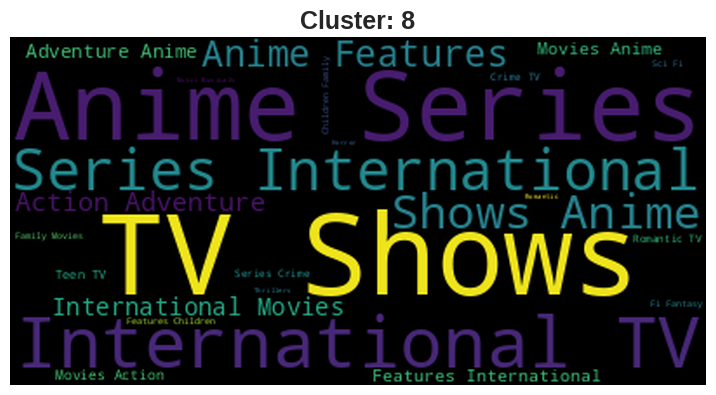

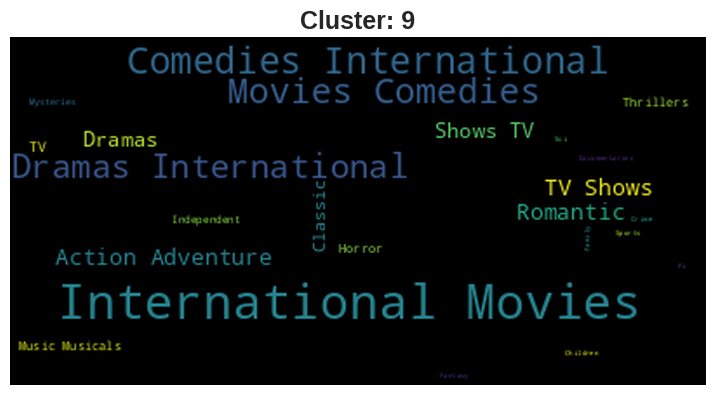

In [ ]:
for i in range(10):
  func_select_Category_agg_clustering(i,'listed_in')

Here again we have created thw word plot for our listed_in variable to check the distribution of words in different clusters. And we can see that
* Cluster 0 contains maximum no. of documentaries, musical, sports.
* Cluster 1 contains maximum no. of Independent, International, Horror movies.
* Cluster 2 contains max no of TV shows
* Cluster 3 conatins max no. of family, kids movies.
* Cluster 4 contains max no. of Korean, Crime thriller movies.
* Cluster 5 contains max no. of Standup comedy shows.
* Cluster 6 contains max no. of nature and science.]
* Cluster 7 contains max no. of Drama, Comedy and International movies.
* Cluster 8 contains max no. of Anime movies and anime series.
* Cluster 9 contains max no.of action, comedies, dramas and international movies.

## **Content Based Recommender System**

In [ ]:
import nltk
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
#removing stopwords
tfidf = TfidfVectorizer(stop_words='english')

In [ ]:
#create TF-IDF matrix by fitting and transforming the data
tfidf_matrix = tfidf.fit_transform(data['org_new'])

#shape of tfidf_matrix
tfidf_matrix.shape

(7770, 41973)

We'll use cosine similarity over tf-idf because-:
* Cosine similarity handles high dimensional sparse data better.

* Cosine similarity captures the meaning of the text better than tf-idf. For example, if two items contain similar words but in different orders, cosine similarity would still consider them similar, while tf-idf may not. This is because tf-idf only considers the frequency of words in a document and not their order or meaning.

### **Using Cosine Similarity**

Cosine similarity is a measure of similarity between two non-zero vectors in a multidimensional space. It measures the cosine of the angle between the two vectors, which ranges from -1 (opposite direction) to 1 (same direction), with 0 indicating orthogonality (the vectors are perpendicular to each other).

In this project we have used cosine similarity which is used to determine how similar two documents or pieces of text are. We represent the documents as vectors in a high-dimensional space, where each dimension represents a word or term in the corpus. We can then calculate the cosine similarity between the vectors to determine how similar the documents are based on their word usage.

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
cosine_sim = cosine_similarity(tfidf_matrix)

In [ ]:
programme_list=new_df['title'].to_list()

In [ ]:
def recommend(title, cosine_similarity=cosine_sim):
    index = programme_list.index(title)         #finds the index of the input title in the programme_list.
    sim_score = list(enumerate(cosine_sim[index])) #creates a list of tuples containing the similarity score and index between the input title and all other programmes in the dataset.

    #position 0 is the movie itself, thus exclude
    sim_score = sorted(sim_score, key= lambda x: x[1], reverse=True)[1:11]  #sorts the list of tuples by similarity score in descending order.
    recommend_index = [i[0] for i in sim_score]
    rec_movie = new_df['title'].iloc[recommend_index]
    rec_score = [round(i[1],4) for i in sim_score]
    rec_table = pd.DataFrame(list(zip(rec_movie,rec_score)), columns=['Recommended movie','Similarity(0-1)'])
    return rec_table

This function calculates the cosine similarity scores between the input title and all other titles in the dataset, sorts them in descending order, and returns the top 10 movies with the highest similarity scores as recommendations.

In [ ]:
recommend("Gunjan Saxena: The Kargil Girl")

,Recommended movie,Similarity(0-1)
0,Dilwale,0.1464
1,Toilet: Ek Prem Katha,0.1457
2,Anarkali of Aarah,0.1425
3,Coffee with D,0.1349
4,Fida,0.1337
5,The Zoya Factor,0.1313
6,Ram Teri Ganga Maili,0.1247
7,Ginny Weds Sunny,0.1240
8,Stree,0.1224
9,The Shaukeens,0.1165


In [ ]:
recommend("Kong: King of the Apes")

,Recommended movie,Similarity(0-1)
0,Littlest Pet Shop: A World of Our Own,0.2574
1,Super Monsters,0.2560
2,Super Monsters Monster Pets,0.2490
3,Super Monsters Save Halloween,0.2393
4,Pac-Man and the Ghostly Adventures,0.2364
5,Super Monsters Monster Party,0.2362
6,Super Monsters Back to School,0.2348
7,Super Monsters Save Christmas,0.2100
8,The Deep,0.2094
9,LoliRock,0.2075


In [ ]:
recommend("Golmaal Returns")

,Recommended movie,Similarity(0-1)
0,Golmaal: Fun Unlimited,0.2726
1,Satyagraha,0.2040
2,Maine Pyaar Kyun Kiya,0.1676
3,Thank You,0.1675
4,Jab We Met,0.1652
5,No Entry,0.1552
6,Singham,0.1543
7,Chup Chup Ke,0.1497
8,Fitoor,0.1492
9,C Kkompany,0.1481


## ***8.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [ ]:
# Save the File
# save the function as a pickle file
import pickle
with open('recommend.pkl', 'wb') as f:
    pickle.dump(recommend, f)

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

* Incorporating external datasets, such as IMDB ratings and Rotten Tomatoes, with this dataset can yield numerous intriguing discoveries.

* More time could be given on clustering analysis to try out different clustering algorithms like DBSCAN.

* More time could be given in improving the recommender system and building a working app on this recommender system.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***